# Analysis of networks of persons in relation to organisations


Cf. [this notebook](https://github.com/Sciences-historiques-numeriques/histoire_numerique_methodes/blob/main/analyse_reseaux/reseaux_florence.ipynb) about families and power in Renaissance Florence for an introduction to network analysis with the *networkx* Python library



In [1]:
import pandas as pd


import networkx as nx
from networkx.algorithms import bipartite

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.ticker import MaxNLocator

from scipy.stats import spearmanr
import statsmodels.api as sm

import numpy as np
import seaborn as sns
import math
import os

In [2]:
### Librairies déjà installées avec Python
import pprint
import csv

import sqlite3 as sql

### this library allows to do SQL queries on dataframes
import duckdb

import pickle

import time
import datetime
from dateutil import parser


from shutil import copyfile


In [3]:
### Importing a custom function module
##  NOTE: The ‘sparql_functions.py’ file must be located 
#   in a folder that is included in the search path
#   recognized by this Jupyter notebook so that
#   the import works correctly

import sys
from importlib import reload

# Add parent directory to the path
sys.path.insert(0, '..')

### If you want to add the parent-parent directory,
sys.path.insert(0, '../..')



In [4]:

import network_analysis_functions as naf
import bivariate_library as bl

In [5]:
print(reload(bl))  

<module 'bivariate_library' from '/home/my_venvs/LOD_NicoSidler/notebooks_jupyter/wikidata_exploration/../bivariate_library.py'>


In [6]:
import warnings
warnings.filterwarnings('ignore')


## Get and inspect the data


### Get the network data

We use here the network data prepared in this notebook 
* Get the [Network creation](https://github.com/Sciences-historiques-numeriques/astronomers/blob/main/notebooks_jupyter/wikidata_exploration/da6-persons-network-creation.ipynb)

In [7]:
### Upload the network prepared in the Network creation

file_address='da_data/da6-networks.pkl'
network=pd.read_pickle(file_address)
print(len(network))
network.iloc[:3]

21059


,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,orgs_number_empl,orgs_labels_empl,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
0,Horst Baier,Theodor W. Adorno,1933,1903,1971-1995,1946-1970,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q152388
1,Horst Baier,Jutta Allmendinger,1933,1956,1971-1995,1996-2020,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q1714580
2,Horst Baier,Alfred Schmidt,1933,1931,1971-1995,1971-1995,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q215896


#### Swap the values in order to have always older person in position x

We want to have the older person always in the in the first position.

This will be useful when coloring the network's edges: you then have to choose between one of the two persons and this gives the direction of the flow of time

In [8]:
### Get the rows where persons chronologically inversed
inverse_df=network[network['per_activ_x']>network['per_activ_y']]
print(len(inverse_df))
inverse_df.head()

4889


,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,orgs_number_empl,orgs_labels_empl,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
0,Horst Baier,Theodor W. Adorno,1933,1903,1971-1995,1946-1970,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q152388
5,Horst Baier,Arnold Gehlen,1933,1904,1971-1995,1946-1970,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q61616
9,Zsuzsa Ferge,István Imreh,1931,1919,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,Hungarian Academy of Sciences,http://www.wikidata.org/entity/Q1000622,http://www.wikidata.org/entity/Q1096729
11,Zsuzsa Ferge,István Kemény,1931,1925,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,Hungarian Academy of Sciences,http://www.wikidata.org/entity/Q1000622,http://www.wikidata.org/entity/Q1106778
13,Zsuzsa Ferge,Leslie Kish,1931,1910,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,Hungarian Academy of Sciences,http://www.wikidata.org/entity/Q1000622,http://www.wikidata.org/entity/Q1111892


In [9]:
### Copy networks to work on copies
df = network.copy()
df_new = network.copy()

In [10]:
### Swap only the rosw in index


# The specific indices where the swap must occur
indices_to_swap = inverse_df.index


# Identify all column pairs (_x and _y) dynamically
x_cols = [col for col in df.columns if col.endswith('_x')]
pairs = []
for x_col in x_cols:
    base = x_col.replace('_x', '')
    y_col = f"{base}_y"
    if y_col in df.columns:
        pairs.append((x_col, y_col))

# Perform the swap ONLY for the rows in indices_to_swap
for x_col, y_col in pairs:
    # Extract values at the specific indices
    vals_x = df_new.loc[indices_to_swap, x_col].values
    vals_y = df_new.loc[indices_to_swap, y_col].values
    
    # Assign swapped values back to the same specific indices
    df_new.loc[indices_to_swap, x_col] = vals_y
    df_new.loc[indices_to_swap, y_col] = vals_x

# df_new now has swapped values for rows in index
# All other rows remain exactly as they were in the original df

##### Check swap result

In [11]:
## example
ii=inverse_df.sort_values(by='sum_edu_empl', ascending=False).index
print(ii[2000:2005])

Index([6601, 6602, 6612, 7378, 7379], dtype='int64')


In [12]:
df_new.iloc[ii[2000:2005]]

,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,orgs_number_empl,orgs_labels_empl,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
6601,Adelaide M. Cromwell,Julia Kristeva,1919,1941,1946-1970,1971-1995,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q28528823,http://www.wikidata.org/entity/Q159876
6602,David McClelland,Julia Kristeva,1917,1941,1946-1970,1971-1995,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q28876,http://www.wikidata.org/entity/Q159876
6612,Erving Goffman,Julia Kristeva,1922,1941,1946-1970,1971-1995,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q314471,http://www.wikidata.org/entity/Q159876
7378,Herbert Simon,James Samuel Coleman,1916,1926,1946-1970,1971-1995,0,2,0,NaN,0,NaN,2,American Academy of Arts and Sciences|National...,http://www.wikidata.org/entity/Q181529,http://www.wikidata.org/entity/Q1681079
7379,Matilda White Riley,James Samuel Coleman,1911,1926,1946-1970,1971-1995,0,2,0,NaN,0,NaN,2,American Academy of Arts and Sciences|National...,http://www.wikidata.org/entity/Q1844137,http://www.wikidata.org/entity/Q1681079


In [13]:
network.iloc[ii[2000:2005]]

,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,orgs_number_empl,orgs_labels_empl,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
6601,Julia Kristeva,Adelaide M. Cromwell,1941,1919,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q159876,http://www.wikidata.org/entity/Q28528823
6602,Julia Kristeva,David McClelland,1941,1917,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q159876,http://www.wikidata.org/entity/Q28876
6612,Julia Kristeva,Erving Goffman,1941,1922,1971-1995,1946-1970,0,1,0,NaN,0,NaN,1,American Academy of Arts and Sciences,http://www.wikidata.org/entity/Q159876,http://www.wikidata.org/entity/Q314471
7378,James Samuel Coleman,Herbert Simon,1926,1916,1971-1995,1946-1970,0,2,0,NaN,0,NaN,2,American Academy of Arts and Sciences|National...,http://www.wikidata.org/entity/Q1681079,http://www.wikidata.org/entity/Q181529
7379,James Samuel Coleman,Matilda White Riley,1926,1911,1971-1995,1946-1970,0,2,0,NaN,0,NaN,2,American Academy of Arts and Sciences|National...,http://www.wikidata.org/entity/Q1681079,http://www.wikidata.org/entity/Q1844137


In [14]:
### Replace the original network

network=df_new


### Get the data about persons


#### Get the individuals (20000) used for correspondence analysis 


In [15]:
### Information about persons with gender, birth date,
# coded country, etc.
csv_address='da_data/da4-AFC.csv'
### csv_address='da_data/da2-birth-place.csv'
df_p = pd.read_csv(csv_address)
df_p=df_p[['uriPer', 'labelPer', 'birthYear', 'gender', 'labelPlace', 'REGION', 'NAME_ENGL', 'coded_country', 'periodsActivity']]
### Rename columns to have shorter labels
df_p.columns=['person_uri',
 'labelPer',
 'birthYear',
 'gender',
 'labelPlace',
 'REGION',
 'NAME_ENGL',
 'country',
 'per_activ'
 ]


In [16]:
### Inspect the dataframe and 
# notably if there are missing values
df_p.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7917 entries, 0 to 7916
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   person_uri  7917 non-null   object
 1   labelPer    7917 non-null   object
 2   birthYear   7917 non-null   int64 
 3   gender      7917 non-null   object
 4   labelPlace  7917 non-null   object
 5   REGION      7917 non-null   object
 6   NAME_ENGL   7917 non-null   object
 7   country     7917 non-null   object
 8   per_activ   7518 non-null   object
dtypes: int64(1), object(8)
memory usage: 556.8+ KB


In [17]:
print(len(df_p))
df_p.iloc[:3]

7917


,person_uri,labelPer,birthYear,gender,labelPlace,REGION,NAME_ENGL,country,per_activ
0,http://www.wikidata.org/entity/Q5539301,George Fitzhugh,1806,male,Prince William County,Northern America,United States,United States Can.,1846-1870
1,http://www.wikidata.org/entity/Q1031841,Constantin Pecqueur,1801,male,Arleux,Western Europe,France,France,1846-1870
2,http://www.wikidata.org/entity/Q452627,Pierre Guillaume Frédéric le Play,1806,male,La Rivière-Saint-Sauveur,Western Europe,France,France,1846-1870


## Create the graphs

We will now transform our networks into graphs using the Python *networkx* library

In [18]:
network.iloc[:2]

,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,orgs_number_empl,orgs_labels_empl,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
0,Theodor W. Adorno,Horst Baier,1903,1933,1946-1970,1971-1995,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q152388,http://www.wikidata.org/entity/Q1000087
1,Horst Baier,Jutta Allmendinger,1933,1956,1971-1995,1996-2020,1,1,0,NaN,1,Goethe University Frankfurt,0,NaN,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q1714580


### Education

In [19]:
### Take all the relathioships with an educational link 
ntwk_edu=network[network.orgs_number_edu>0][['labelPer_x', 'labelPer_y', 'birthYear_x', 'birthYear_y', 'per_activ_x', 'per_activ_y', 'sum_edu_empl', 'sum_all_rel', 'orgs_number_edu', 'orgs_labels_edu','person_uri_x', 'person_uri_y']]
print(len(ntwk_edu))
ntwk_edu.iloc[:2]


1358


,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_edu,orgs_labels_edu,person_uri_x,person_uri_y
59,Zsuzsa Ferge,Iván Szelényi,1931,1938,1971-1995,1971-1995,1,2,1,Corvinus University of Budapest,http://www.wikidata.org/entity/Q1000622,http://www.wikidata.org/entity/Q538477
109,Audrey Célestine,Markéta Sedláčková,1980,1976,,,1,1,1,Sciences Po,http://www.wikidata.org/entity/Q101440467,http://www.wikidata.org/entity/Q91444798


In [20]:
## Provide the data in the format 
# required by Networkx

l = [tuple(
    (e['person_uri_x'], e['person_uri_y'],
     {'orgsLabels':e['orgs_labels_edu'], 'orgsNumber':e['orgs_number_edu'],
      'per_activ_x':e['per_activ_x'], 'per_activ_y':e['per_activ_y']}
     )) 
     for e in ntwk_edu.to_dict(orient='records')]
print(len(l))

1358


In [21]:
## Créate the empty graph
G_edu=nx.Graph()

## Add relationships to graph
# Multiple rows between two edges are taken only once
G_edu.add_edges_from(l)

naf.basic_graph_properties(G_edu)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 598,
 'number_of_edges': 1358,
 '------': '------',
 'is connected': False,
 'components': 63,
 'density': 0.007607715276493953}


#### Add metadata to nodes

In [22]:
df_p.head(2)

,person_uri,labelPer,birthYear,gender,labelPlace,REGION,NAME_ENGL,country,per_activ
0,http://www.wikidata.org/entity/Q5539301,George Fitzhugh,1806,male,Prince William County,Northern America,United States,United States Can.,1846-1870
1,http://www.wikidata.org/entity/Q1031841,Constantin Pecqueur,1801,male,Arleux,Western Europe,France,France,1846-1870


In [23]:
df_pm = df_p[['person_uri','labelPer', 'birthYear', 'gender','per_activ','country']]
df_pm = df_pm.drop_duplicates()
df_pm.columns=['uri', 'label', 'birthYear', 'gender','per_activ','country']
df_pm.head()


,uri,label,birthYear,gender,per_activ,country
0,http://www.wikidata.org/entity/Q5539301,George Fitzhugh,1806,male,1846-1870,United States Can.
1,http://www.wikidata.org/entity/Q1031841,Constantin Pecqueur,1801,male,1846-1870,France
2,http://www.wikidata.org/entity/Q452627,Pierre Guillaume Frédéric le Play,1806,male,1846-1870,France
3,http://www.wikidata.org/entity/Q234570,Harriet Martineau,1802,female,1846-1870,United Kingdom
4,http://www.wikidata.org/entity/Q358497,Alexei Khomyakov,1804,male,1846-1870,Russian Federation


In [24]:
### Prepare data to add to nodes
# The data must be of type : dictionary, i.e. key:value structure
ln = dict([(e['uri'],
     {'label':e['label'], 
       'birthYear':e['birthYear'],
       'gender':e['gender'],
       'per_activ':e['per_activ'],
      'country':e['country']}
     ) for e in df_pm.to_dict(orient='records')])
# print(str(l)[:200])


In [25]:

## Add attributes
nx.set_node_attributes(G_edu, ln)
pprint.pprint(list(G_edu.nodes.data())[:2])

edu_gu = G_edu


[('http://www.wikidata.org/entity/Q1000622',
  {'birthYear': 1931,
   'country': 'Austria Hungary',
   'gender': 'female',
   'label': 'Zsuzsa Ferge',
   'per_activ': '1971-1995'}),
 ('http://www.wikidata.org/entity/Q538477',
  {'birthYear': 1938,
   'country': 'Austria Hungary',
   'gender': 'male',
   'label': 'Iván Szelényi',
   'per_activ': '1971-1995'})]


In [26]:
naf.basic_graph_properties(G_edu)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 598,
 'number_of_edges': 1358,
 '------': '------',
 'is connected': False,
 'components': 63,
 'density': 0.007607715276493953}


#### Edu Components

This graph isn't connected. This means that there are parts of the graph, called 'components', that are separated from other parts.

In [27]:
### Create a list of graphs, one per component
perS_edu = [G_edu.subgraph(c).copy() for c in nx.connected_components(G_edu)]

### i is the component index in the list S of graphs , len(s.nodes) is the nomber of nodes
lc = sorted([[i,len(s.nodes)] for i,s in enumerate(perS_edu)], key = lambda row: row[1], reverse=True)
print(lc[:5])

### Again we observe that there is a big connected graphe 
# and a multitude of small graphs

[[0, 398], [26, 14], [32, 13], [13, 9], [12, 8]]


### Explore small graph

In [28]:
### 
li = [2]    # [48,36, ..]
ll = [list(perS_edu[i[0]].nodes.data()) for i in ln if i[0] in li ]
#pprint.pprint(str(ll)[:300])

In [29]:

# Display variable

variable_name = 'edu_2'

globals()[variable_name] = nx.Graph()

edu_2=globals()[variable_name]

for i in li:
    ## ajoute au graphe les composantes en utilisant
    # l'index ou position dans la liste de graphes 'S'
    edu_2 = nx.union(edu_2, perS_edu[i])
naf.basic_graph_properties(edu_2)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 2,
 'number_of_edges': 1,
 '------': '------',
 'is connected': True,
 'components': 1,
 'density': 1.0}


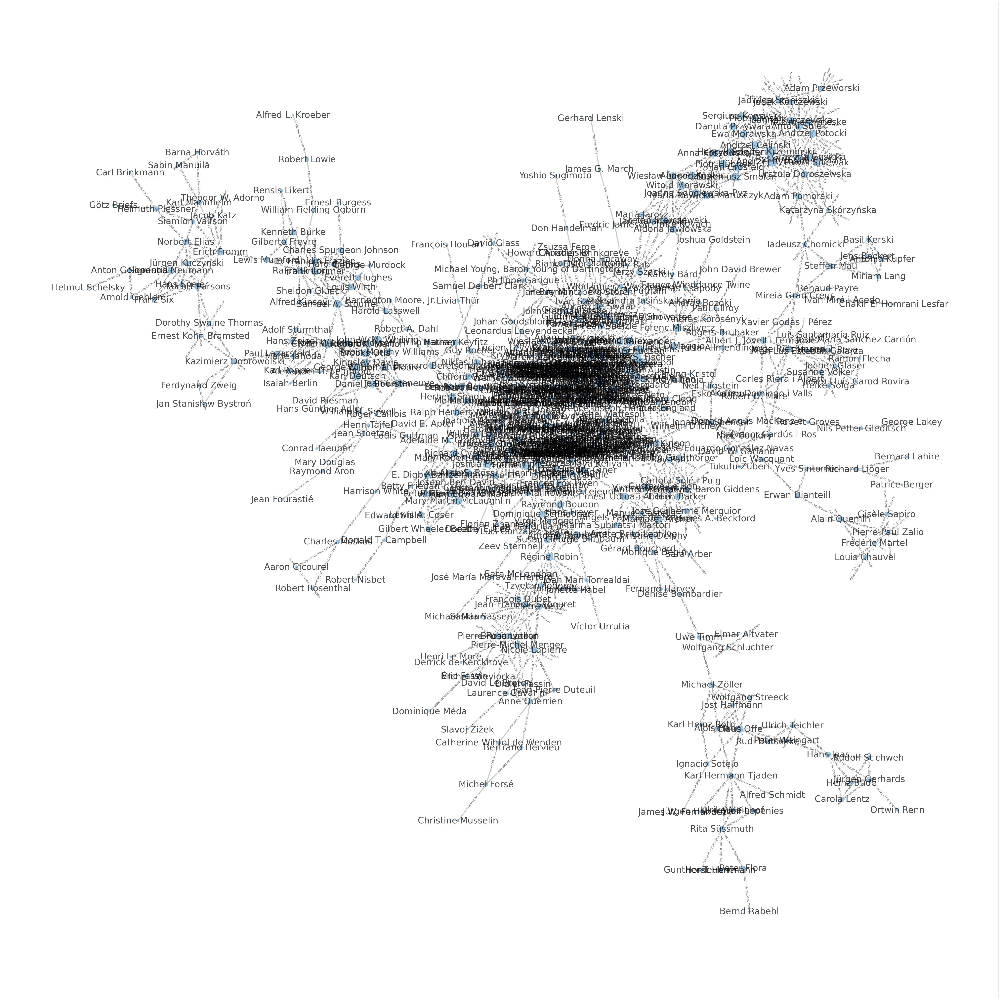

In [30]:
### Draw graph with networkx



# print(list(g.nodes.data())[:3])
# print(list(g.edges.data())[:3])

n_size = np.log(np.sqrt(nx.number_of_nodes(edu_gu)))*20 #*25

graph_layout = 'kamada_kawai'
n_k = 0.4
sc = 0.02

### Define the layout, i.e. the choice 
# of the algorithm for the representation of the graph.

if graph_layout == 'fruchterman_reingold':
    pos = nx.fruchterman_reingold_layout(edu_gu)
elif graph_layout == 'kamada_kawai':
    pos = nx.kamada_kawai_layout(edu_gu)
elif graph_layout == 'spring_layout':
    pos = nx.spring_layout(g, k = n_k, scale=sc)  
else:
    pos = nx.kamada_kawai_layout(edu_gu)


# https://networkx.org/documentation/stable/reference/drawing.html
plt.figure(figsize = (n_size,n_size))

node_size = [d[1]*n_size for d in nx.degree(edu_gu)]
node_labels = dict([tuple(( n[0] , n[1]['label'] ))for n in edu_gu.nodes.data()])
#print(node_labels)
edge_labels = {e: edu_gu.get_edge_data(e[0], e[1])["orgsLabels"] for e in edu_gu.edges()}
#print(edge_labels)


### On représente successivement les différentes sommets et arêtes,
# puis on ajoute les labels
nx.draw_networkx_nodes(edu_gu, pos,  node_size=node_size, alpha=0.4)
nx.draw_networkx_edges(edu_gu, pos, label=edge_labels, width=4, alpha=0.2) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(edu_gu, pos, labels=node_labels, alpha=0.7, font_size=n_size/2)
nx.draw_networkx_edge_labels(edu_gu, pos=pos, edge_labels=edge_labels, alpha=0.6)

### On peut augmenter ou diminuer ce paramètre pour ajuster le graphe
plt.tight_layout(pad=50)
#plt.savefig('images/small_bipartite_component.svg')
plt.show()


### Explore with Gephi online

* export the graph in the Gephi format
* explore it uploading the file into the [Gephi Web User Interface](https://lite.gephi.org)
* use the ForceAtlas2 algorythm: first click on the 'magic' button (left of the 'Start' button) then on Start

In [31]:
### Graph to heavy to use Gephy online
nx.write_gexf(edu_gu, f"da_graphs/{variable_name}.gexf")

### Main component

In [32]:
### Get the list of the nodes in the main component
li = [1]    
ll = [list(perS_edu[i[1]].nodes.data()) for i in ln if i[1] in li]

In [33]:

variable_name = 'edu_2'

globals()[variable_name] = nx.Graph()
# Change the left side from edu_gu to edu_2
edu_2 = globals()[variable_name]

for i in li:
    # Change from edu_gu to edu_2 here too
    edu_2 = nx.union(edu_2, perS_edu[i])

naf.basic_graph_properties(edu_2)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 2,
 'number_of_edges': 1,
 '------': '------',
 'is connected': True,
 'components': 1,
 'density': 1.0}


In [34]:
pprint.pprint(list(edu_gu.nodes.data())[2:4])

[('http://www.wikidata.org/entity/Q101440467',
  {'birthYear': 1980,
   'country': 'France',
   'gender': 'female',
   'label': 'Audrey Célestine',
   'per_activ': nan}),
 ('http://www.wikidata.org/entity/Q91444798',
  {'birthYear': 1976,
   'country': 'Czechia',
   'gender': 'female',
   'label': 'Markéta Sedláčková',
   'per_activ': nan})]


In [35]:
### Graph to heavy to use Gephy online
# nx.write_gexf(gu, f"da_graphs/{variable_name}.gexf")

### Employment graph

In [36]:
### Take all the relathioships with an educational link 
ntwk_empl=network[network.orgs_number_empl>0][['labelPer_x', 'labelPer_y', 'birthYear_x', 'birthYear_y', 'per_activ_x', 'per_activ_y', 'sum_edu_empl', 'sum_all_rel', 'orgs_number_empl', 'orgs_labels_empl','person_uri_x', 'person_uri_y']]
print(len(ntwk_empl))
ntwk_empl.iloc[:2]


5867


,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_empl,orgs_labels_empl,person_uri_x,person_uri_y
0,Theodor W. Adorno,Horst Baier,1903,1933,1946-1970,1971-1995,1,1,1,Goethe University Frankfurt,http://www.wikidata.org/entity/Q152388,http://www.wikidata.org/entity/Q1000087
1,Horst Baier,Jutta Allmendinger,1933,1956,1971-1995,1996-2020,1,1,1,Goethe University Frankfurt,http://www.wikidata.org/entity/Q1000087,http://www.wikidata.org/entity/Q1714580


In [37]:
## Provide the data in the format 
# required by Networkx

l = [tuple(
    (e['person_uri_x'], e['person_uri_y'],
     { 'orgsLabels':e['orgs_labels_empl'], 'orgsNumber':e['orgs_number_empl'],   
      'periods_x':e['per_activ_x'], 'periods_y':e['per_activ_y']}
     )) 
     for e in ntwk_empl.to_dict(orient='records')]
print(len(l))

5867


In [38]:
## Créate the empty graph
G_empl=nx.Graph()

## Add relationships to graph
# Multiple rows between two edges are taken only once
G_empl.add_edges_from(l)

naf.basic_graph_properties(G_empl)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 756,
 'number_of_edges': 5867,
 '------': '------',
 'is connected': False,
 'components': 29,
 'density': 0.020557833140614597}


In [39]:
### Add person attributes to nodes

## the ln list was prepared above

## Add attributes
nx.set_node_attributes(G_empl, ln)
pprint.pprint(list(G_empl.nodes.data())[:2])


[('http://www.wikidata.org/entity/Q152388',
  {'birthYear': 1903,
   'country': 'Germany',
   'gender': 'male',
   'label': 'Theodor W. Adorno',
   'per_activ': '1946-1970'}),
 ('http://www.wikidata.org/entity/Q1000087',
  {'birthYear': 1933,
   'country': 'Czechia',
   'gender': 'male',
   'label': 'Horst Baier',
   'per_activ': '1971-1995'})]


In [40]:
### Create a list of graphs, one per component
perS_empl = [G_empl.subgraph(c).copy() for c in nx.connected_components(G_empl)]

### i is the component index in the list S of graphs , len(s.nodes) is the nomber of nodes
lc = sorted([[i,len(s.nodes)] for i,s in enumerate(perS_empl)], key = lambda row: row[1], reverse=True)
print(lc[:5])

### Again we observe that there is a big connected graphe 
# and a multitude of small graphs

[[0, 676], [4, 10], [1, 4], [6, 4], [9, 4]]


#### Main component

In [41]:
### 
li = [0]    # [15, 33, 30]
ll = [list(perS_empl[i[0]].nodes.data()) for i in ln if i[0] in li ]
#pprint.pprint(str(ll)[:300])

In [42]:

# Display variable

variable_name = 'empl_0'

globals()[variable_name] = nx.Graph()

empl_gu=globals()[variable_name]

for i in li:
    ## ajoute au graphe les composantes en utilisant
    # l'index ou position dans la liste de graphes 'S'
    empl_gu = nx.union(empl_gu, perS_empl[i])
naf.basic_graph_properties(empl_gu)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 676,
 'number_of_edges': 5767,
 '------': '------',
 'is connected': True,
 'components': 1,
 'density': 0.02527722989261451}


### Membership graph

In [43]:
### Take all the relathioships with an educational link 
ntwk_memb=network[network.orgs_number_memb>0][['labelPer_x', 'labelPer_y', 'birthYear_x', 
                                               'birthYear_y', 'per_activ_x', 'per_activ_y', 
                                               'sum_edu_empl', 'sum_all_rel', 
                                               'orgs_number_memb', 'orgs_labels_memb','person_uri_x', 'person_uri_y']]
print(len(ntwk_memb))
ntwk_memb.iloc[:2]


16262


,labelPer_x,labelPer_y,birthYear_x,birthYear_y,per_activ_x,per_activ_y,sum_edu_empl,sum_all_rel,orgs_number_memb,orgs_labels_memb,person_uri_x,person_uri_y
8,Zsuzsa Ferge,Witold Morawski,1931,1938,1971-1995,1971-1995,0,1,1,Academia Europaea,http://www.wikidata.org/entity/Q1000622,http://www.wikidata.org/entity/Q108198189
9,István Imreh,Zsuzsa Ferge,1919,1931,1946-1970,1971-1995,0,1,1,Hungarian Academy of Sciences,http://www.wikidata.org/entity/Q1096729,http://www.wikidata.org/entity/Q1000622


In [44]:
## Provide the data in the format 
# required by Networkx

l = [tuple(
    (e['person_uri_x'], e['person_uri_y'],
     { 'orgsLabels':e['orgs_labels_memb'], 'orgsNumber':e['orgs_number_memb'],   
      'periods_x':e['per_activ_x'], 'periods_y':e['per_activ_y']}
     )) 
     for e in ntwk_memb.to_dict(orient='records')]
print(len(l))

16262


In [45]:
## Créate the empty graph
G_memb=nx.Graph()

## Add relationships to graph
# Multiple rows between two edges are taken only once
G_memb.add_edges_from(l)

naf.basic_graph_properties(G_memb)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 917,
 'number_of_edges': 16262,
 '------': '------',
 'is connected': False,
 'components': 42,
 'density': 0.038720338296990855}


In [46]:
### Add person attributes to nodes

## the ln list was prepared above

## Add attributes
nx.set_node_attributes(G_memb, ln)
pprint.pprint(list(G_memb.nodes.data())[:2])


[('http://www.wikidata.org/entity/Q1000622',
  {'birthYear': 1931,
   'country': 'Austria Hungary',
   'gender': 'female',
   'label': 'Zsuzsa Ferge',
   'per_activ': '1971-1995'}),
 ('http://www.wikidata.org/entity/Q108198189',
  {'birthYear': 1938,
   'country': 'Poland',
   'gender': 'male',
   'label': 'Witold Morawski',
   'per_activ': '1971-1995'})]


In [47]:
### Create a list of graphs, one per component
perS_memb = [G_memb.subgraph(c).copy() for c in nx.connected_components(G_memb)]

### i is the component index in the list S of graphs , len(s.nodes) is the nomber of nodes
lc = sorted([[i,len(s.nodes)] for i,s in enumerate(perS_memb)], key = lambda row: row[1], reverse=True)
print(lc[:5])

### Again we observe that there is a big connected graphe 
# and a multitude of small graphs

[[0, 806], [4, 5], [14, 5], [16, 5], [2, 4]]


#### Main component

In [48]:
### 
li = [0]    # [15, 33, 30]
ll = [list(perS_memb[i[0]].nodes.data()) for i in ln if i[0] in li ]
#pprint.pprint(str(ll)[:300])

In [49]:

# Display variable

variable_name = 'memb_0'

globals()[variable_name] = nx.Graph()

memb_gu=globals()[variable_name]

for i in li:
    ## ajoute au graphe les composantes en utilisant
    # l'index ou position dans la liste de graphes 'S'
    memb_gu = nx.union(memb_gu, perS_memb[i])
naf.basic_graph_properties(memb_gu)


{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 806,
 'number_of_edges': 16171,
 '------': '------',
 'is connected': True,
 'components': 1,
 'density': 0.049846647041597955}


## Multylayer analysis : position of persons

The idea and code of this analysis comes from prompting Euria in May 2026: [here is the link](https://euria.infomaniak.com/shared/019e34b4-1ca7-73d6-841d-075a744e609b)





Analysing the positions of physicists across three distinct relational layers (education, employment and academy membership) constitutes an analysis of a multiplex network (or multilayer network). Each graph represents a different phase or dimension of the physicists' career:
1.  **Education Graph:** Peer formation and early networking (latent potential).
2.  **Employment Graph:** Professional collaboration and institutional power (active production).
3.  **Membership Graph:** Prestige, recognition, and gatekeeping (established authority).

### 1. The Career Trajectory
Instead of looking at the graphs in isolation, map the evolution of an actor's centrality:
*   **The "Star" Trajectory:** High degree in Education $\rightarrow$ High degree in Employment $\rightarrow$ High degree in Membership. (Consistent elite).
*   **The "Hidden Gem":** Low/Medium in Education $\rightarrow$ High in Employment $\rightarrow$ High in Membership. (Rose through merit/work).
*   **The "Academic Prince":** High in Education (popular student) $\rightarrow$ Low in Employment $\rightarrow$ High in Membership. (Recognized for potential/pedigree rather than output).
*   **The "Workhorse":** Low in Education $\rightarrow$ High in Employment $\rightarrow$ Low in Membership. (Productive but excluded from elite academies).

### 2. Method: Multilayer Centrality Correlation
Calculate specific centrality measures for each graph and correlate them to see if "power" transfers between layers.

**Recommended Metrics per Layer:**
*   **Education:**  *Degree Centrality* (or alternatively *Clustering Coefficient* about tightness of student cohorts)
*   **Employment:** *Betweenness Centrality* (bridging different departments/universities).
*   **Membership:** *Eigenvector Centrality* (working with other important people).


### Prepare sets

In [50]:
print(edu_gu.number_of_nodes())
print(empl_gu.number_of_nodes())
print(memb_gu.number_of_nodes())
all_nodes=set(edu_gu.nodes()) & set(empl_gu.nodes())  & set(memb_gu.nodes())
print(len(all_nodes))


598
676
806
365


In [51]:
### Creates aligned subgraphs containing only nodes present in ALL three layers.
    

def prepare_multilayer_core(G_edu_full, G_emp_full, G_mem_full):
    
    
    # 1. Find the Intersection of Nodes
    # This gives us the list of physicists with complete data across all 3 layers
    common_nodes = set(G_edu_full.nodes()) & set(G_emp_full.nodes()) & set(G_mem_full.nodes())
    
    print(f"Original counts: Edu={G_edu_full.number_of_nodes()}, Emp={G_emp_full.number_of_nodes()}, Mem={G_mem_full.number_of_nodes()}")
    print(f"Core intersection size: {len(common_nodes)} physicists")
    
    if len(common_nodes) == 0:
        raise ValueError("No common nodes found across the three graphs. Check your node IDs.")

    # 2. Create Subgraphs
    # We use .copy() to create independent graph objects.
    # This is crucial: it removes all edges connected to nodes NOT in common_nodes.
    G_edu_core = G_edu_full.subgraph(common_nodes).copy()
    G_emp_core = G_emp_full.subgraph(common_nodes).copy()
    G_mem_core = G_mem_full.subgraph(common_nodes).copy()
    
    # 3. Verification (Optional but recommended)
    assert set(G_edu_core.nodes()) == set(G_emp_core.nodes()) == set(G_mem_core.nodes())
    
    return G_edu_core, G_emp_core, G_mem_core


In [52]:

# Create the subgraphs
GA_edu, GA_empl, GA_memb = prepare_multilayer_core(edu_gu, empl_gu, memb_gu)


Original counts: Edu=598, Emp=676, Mem=806
Core intersection size: 365 physicists


### Inspect sets

In [53]:
naf.basic_graph_properties(GA_edu)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 365,
 'number_of_edges': 654,
 '------': '------',
 'is connected': False,
 'components': 78,
 'density': 0.009844949570976968}


In [54]:
naf.basic_graph_properties(GA_empl)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 365,
 'number_of_edges': 2536,
 '------': '------',
 'is connected': False,
 'components': 15,
 'density': 0.03817552310702996}


In [55]:
naf.basic_graph_properties(GA_memb)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 365,
 'number_of_edges': 7094,
 '------': '------',
 'is connected': False,
 'components': 17,
 'density': 0.10678910130964925}


In [56]:

# --- Helper Function Defined at Top Level ---
def classify_actor(row, high_thresh=0.8, low_thresh=-0.2):
    """
    Classifies a physicist based on standardized scores (Z-scores).
    Expects a pandas Series with 'edu_z', 'emp_z', 'mem_z'.
    """
    edu, emp, mem = row['edu_z'], row['emp_z'], row['mem_z']
    
    if edu > high_thresh and emp > high_thresh and mem > high_thresh:
        return "Star"
    if edu < low_thresh and emp > high_thresh and mem > high_thresh:
        return "Hidden Gem"
    if emp > high_thresh and mem < low_thresh:
        return "Workhorse"
    if edu > high_thresh and emp < low_thresh and mem > high_thresh:
        return "Academic Prince"
    return "Standard"

def analyze_career_trajectories(G_edu, G_emp, G_mem):
    """
    Main analysis function.
    """
    # 1. Align Nodes
    common_nodes = set(G_edu.nodes()) & set(G_emp.nodes()) & set(G_mem.nodes())
    if not common_nodes:
        raise ValueError("No common nodes found.")
    
    # 2. Calculate Metrics
    edu_scores = nx.degree_centrality(G_edu)
    emp_scores = nx.betweenness_centrality(G_emp)
    mem_scores = nx.eigenvector_centrality(G_mem, max_iter=1000)
    
    # 3. Create DataFrame
    df = pd.DataFrame({
        'physicist': list(common_nodes),
        'edu_raw': [edu_scores[n] for n in common_nodes],
        'emp_raw': [emp_scores[n] for n in common_nodes],
        'mem_raw': [mem_scores[n] for n in common_nodes]
    })
    
    # 4. Standardize
    cols = ['edu_raw', 'emp_raw', 'mem_raw']
    df[cols] = (df[cols] - df[cols].mean()) / df[cols].std()
    df.rename(columns={'edu_raw': 'edu_z', 'emp_raw': 'emp_z', 'mem_raw': 'mem_z'}, inplace=True)
    
    # 5. Apply Classification
    # We pass the function object to apply(). 
    # 'axis=1' means the function receives one row at a time.
    df['role'] = df.apply(classify_actor, axis=1)
    
    # 6. Return Results
    return {
        'dataframe': df,
        'stars': df[df['role'] == 'Star']['physicist'].tolist(),
        'hidden_gems': df[df['role'] == 'Hidden Gem']['physicist'].tolist(),
        'role_counts': df['role'].value_counts()
    }

In [57]:
### Create Multilayer Centrality Correlation

# This can take some minutes

results = analyze_career_trajectories(GA_edu, GA_empl, G_memb)

# print(f"Stars identified: {len(results['stars'])}")
# print(results['stars'])
# print(f"\nHidden Gems identified: {len(results['hidden_gems'])}")
# print(results['hidden_gems'])
# print("\nCorrelation between layers:")
# print(results['correlation_matrix'])
# print("\nRole Distribution:")
# print(results['role_counts'])

In [58]:
results_dataframe=results['dataframe']
print(len(results_dataframe))
results_dataframe.rename(columns={'physicist':'uri'}, inplace=True)
results_dataframe.iloc[:3]

365


,uri,edu_z,emp_z,mem_z,role
0,http://www.wikidata.org/entity/Q1891695,-1.057151,-0.382747,-0.772246,Standard
1,http://www.wikidata.org/entity/Q6228652,-0.762151,-0.382747,-0.765213,Standard
2,http://www.wikidata.org/entity/Q9144710,0.712850,-0.253908,-0.752066,Standard


In [59]:
print(results_dataframe.groupby(by='role').size().sort_values(ascending=False))

role
Standard           321
Academic Prince     24
Workhorse            9
Hidden Gem           8
Star                 3
dtype: int64


In [60]:
df_pa=pd.merge(df_pm,results_dataframe,left_on='uri',right_on='uri')

In [61]:
df_pa.iloc[:3]

,uri,label,birthYear,gender,per_activ,country,edu_z,emp_z,mem_z,role
0,http://www.wikidata.org/entity/Q61956,Lorenz von Stein,1815,male,1846-1870,Germany,-1.057151,-0.382259,-0.772245,Standard
1,http://www.wikidata.org/entity/Q3131351,Henri Joly,1839,male,1871-1895,France,-0.762151,-0.382747,-0.772172,Standard
2,http://www.wikidata.org/entity/Q64383,Wilhelm Lexis,1837,male,1871-1895,Germany,-0.467151,-0.287137,-0.772171,Standard


In [62]:
duckdb.query(
    f"""
    SELECT * 
    from df_pa 
    where label like '%Einstein%'
    or label like '%Planck%'
    """
).to_df()



,uri,label,birthYear,gender,per_activ,country,edu_z,emp_z,mem_z,role


In [63]:
duckdb.query(
    f"""
    SELECT * 
    from df_pa 
    --where role = 'Hidden Gem'
    --where role = 'Star'
    where role = 'Academic Prince'
    LIMIT 10
    """
).to_df()


,uri,label,birthYear,gender,per_activ,country,edu_z,emp_z,mem_z,role
0,http://www.wikidata.org/entity/Q1103678,Clyde Kluckhohn,1905,male,1946-1970,United States Can.,3.072851,-0.371394,1.058609,Academic Prince
1,http://www.wikidata.org/entity/Q163171,George C. Homans,1910,male,1946-1970,United States Can.,2.187851,-0.371394,1.405538,Academic Prince
2,http://www.wikidata.org/entity/Q312843,Robert K. Merton,1910,male,1946-1970,United States Can.,1.597850,-0.253713,1.428280,Academic Prince
3,http://www.wikidata.org/entity/Q6263871,John W. M. Whiting,1908,male,1946-1970,United States Can.,2.482851,-0.340304,1.226341,Academic Prince
4,http://www.wikidata.org/entity/Q2159863,Robin Murphy Williams,1914,male,1946-1970,United States Can.,1.007850,-0.372776,1.472689,Academic Prince
5,http://www.wikidata.org/entity/Q2129632,Ralph Herbert Turner,1919,male,1946-1970,United States Can.,1.597850,-0.382134,1.713337,Academic Prince
6,http://www.wikidata.org/entity/Q5321821,E. Digby Baltzell,1915,male,1946-1970,United States Can.,1.007850,-0.381626,1.484217,Academic Prince
7,http://www.wikidata.org/entity/Q310956,Clifford Geertz,1926,male,1971-1995,United States Can.,1.302850,-0.278281,1.826929,Academic Prince
8,http://www.wikidata.org/entity/Q62478,Juan José Linz,1926,male,1971-1995,Germany,1.007850,-0.363837,2.005602,Academic Prince
9,http://www.wikidata.org/entity/Q85027,Herbert J. Gans,1927,male,1971-1995,Germany,2.187851,-0.365444,1.801750,Academic Prince


In [64]:

def visualize_role_structures(df):
    """
    df must contain: 'role', 'edu_z', 'emp_z', 'mem_z'
    """
    # Melt the dataframe to long format for easy plotting
    plot_data = df.melt(id_vars=['role'], 
                        value_vars=['edu_z', 'emp_z', 'mem_z'],
                        var_name='Layer', value_name='Z-Score')
    
    # Map layer names for readability
    layer_map = {
        'edu_z': 'Education (Peer Cohort)',
        'emp_z': 'Employment (Brokerage)',
        'mem_z': 'Membership (Prestige)'
    }
    plot_data['Layer'] = plot_data['Layer'].map(layer_map)

    plt.figure(figsize=(12, 8))
    # Boxplot shows the distribution of scores for each role in each layer
    sns.boxplot(data=plot_data, x='Layer', y='Z-Score', hue='role', palette='Set2')
    
    plt.title('Structural Position of Roles Across Career Layers')
    plt.axhline(0, color='black', linestyle='--', linewidth=0.8) # Mean line
    plt.legend(title='Physicist Role', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Usage:
# visualize_role_structures(df_results)

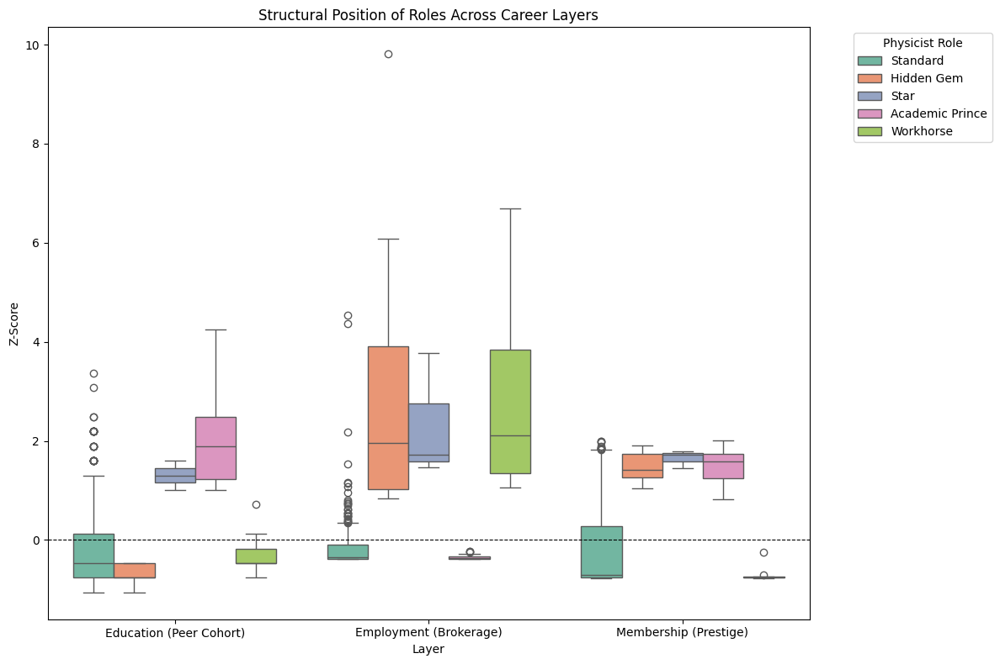

In [65]:
visualize_role_structures(results_dataframe)

### 1. What is a Z-Score?
A **Z-score** (or standard score) measures how many **standard deviations** a data point is away from the mean (average) of the group.

**Formula:**
$$Z = \frac{x - \mu}{\sigma}$$
*   $x$: The raw value (e.g., a physicist's Betweenness score).
*   $\mu$ (mu): The average of all scores in that graph.
*   $\sigma$ (sigma): The standard deviation (how spread out the scores are).

**Interpretation:**
*   **$Z = 0$**: The physicist is exactly average.
*   **$Z = +1.0$**: The physicist is **1 standard deviation above** the average (top ~16% in a normal distribution).
*   **$Z = -1.0$**: The physicist is **1 standard deviation below** the average.
*   **$Z = +2.5$**: The physicist is an extreme outlier (very high centrality).

---

### 2. Why is it critical in this specific analysis?

You are comparing three completely different mathematical metrics:
1.  **Degree Centrality (Education):** Values range from **0.0 to 1.0**. (e.g., Average might be 0.05).
2.  **Betweenness Centrality (Employment):** Values can range from **0.0 to 0.5** (or higher depending on graph size), but the distribution is usually very skewed. (e.g., Average might be 0.002).
3.  **PageRank/Eigenvector (Membership):** Values are relative weights that sum to 1. Individual scores are often tiny decimals like **0.0004**.

#### The Problem: "Apples vs. Oranges"
If you try to compare them directly without Z-scores:
*   Physicist A has Degree = **0.8** (Huge in Education).
*   Physicist A has Betweenness = **0.003** (Looks tiny in Employment).
*   Physicist A has PageRank = **0.0001** (Looks tiny in Membership).

If you sum these raw numbers, **Education dominates completely** because 0.8 is mathematically larger than 0.003. You would incorrectly conclude that Education is the most important factor, simply because its scale is larger.

#### The Solution: Z-Score Normalization
Z-scores convert all three metrics to a **common scale** based on *relative standing* within their own graph.

*   **Degree 0.8** might be $Z = +3.0$ (Top tier in Education).
*   **Betweenness 0.003** might *also* be $Z = +3.0$ (Top tier in Employment, even though the number looks small).
*   **PageRank 0.0001** might be $Z = +3.0$ (Top tier in Membership).

Now, you can fairly say: *"This physicist is in the top tier in ALL THREE layers,"* allowing you to correctly identify them as a **Star**.

---

### 3. How it Enables Role Classification
Your classification logic relies on thresholds like `HIGH = 0.8` and `LOW = -0.2`. These thresholds **only make sense** with Z-scores.

*   **Without Z-scores:** What is a "high" PageRank? Is 0.0005 high? Is 0.005 high? It depends entirely on the specific graph size and density. You would have to guess a new threshold for every dataset.
*   **With Z-scores:**
    *   `Z > 0.8` always means "significantly above average" (roughly top 20%).
    *   `Z < -0.2` always means "slightly below average".
    *   This makes your code **robust** and **portable**. You can run the same script on data from 1800 or 1980, and the definition of "Star" remains statistically consistent.


### Inspect profiles

In [66]:
### Role in relation to country

crosstab = pd.crosstab(df_pa['role'],df_pa['country'] )


In [67]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


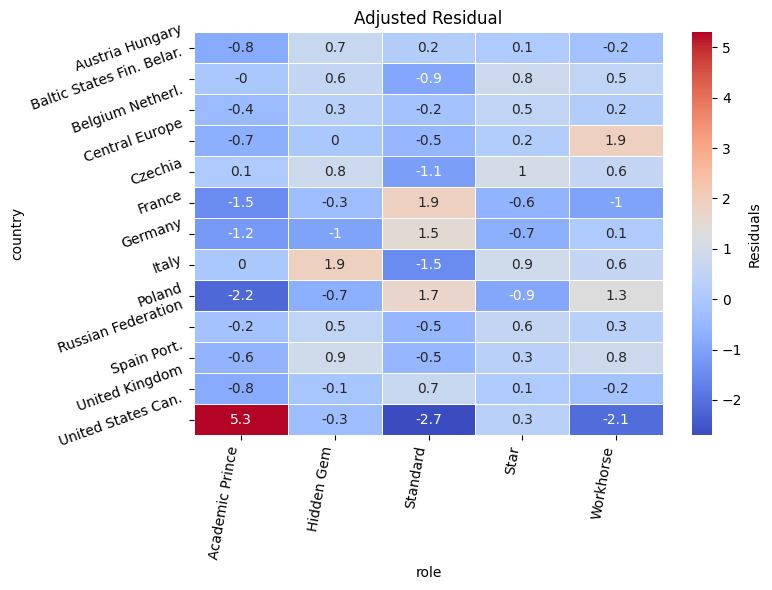

In [68]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(8, 6))

In [69]:
## role in relation to period
crosstab = pd.crosstab(df_pa['role'],df_pa['per_activ'] )


In [70]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


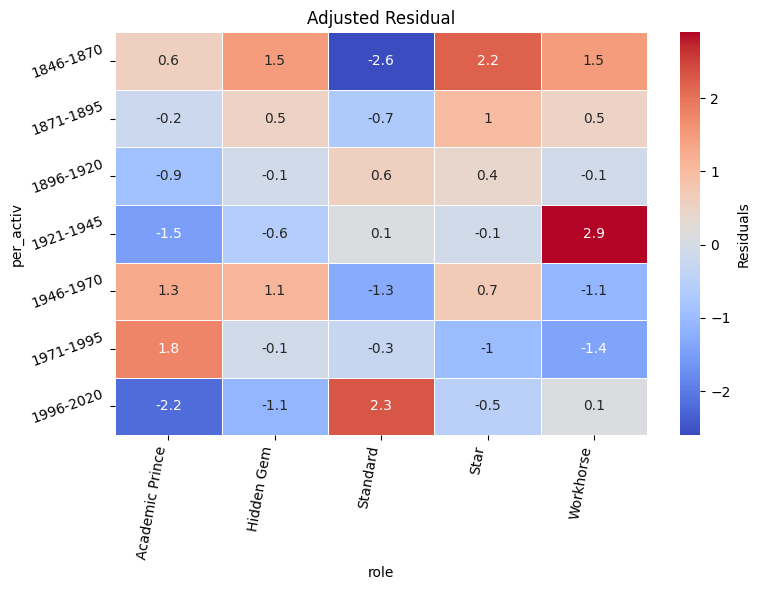

In [71]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(8, 6))

In [72]:
df_pa_filtered=df_pa[df_pa['role'] =='Academic Prince']
crosstab = pd.crosstab(df_pa_filtered['per_activ'],df_pa_filtered['country'] )


In [73]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


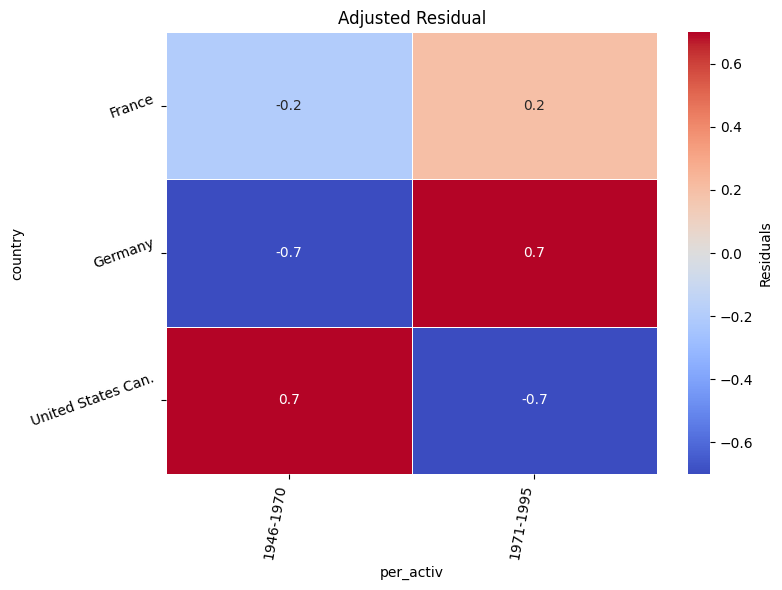

In [74]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(8, 6))

#### Add roles to graphs

In [75]:
### Prepare data to add to nodes
# The data must be of type : dictionary, i.e. key:value structure
lna = dict([(e['uri'],
     {'edu_z':e['edu_z'],
     'emp_z':e['emp_z'],
     'mem_z':e['mem_z'],
     'role':e['role']
     }
     ) for e in df_pa.to_dict(orient='records')])

In [76]:

## Add attributes
nx.set_node_attributes(GA_edu, lna)
pprint.pprint(list(GA_edu.nodes.data())[:2])


[('http://www.wikidata.org/entity/Q538477',
  {'birthYear': 1938,
   'country': 'Austria Hungary',
   'edu_z': 0.41784955228294013,
   'emp_z': 1.1662141001948838,
   'gender': 'male',
   'label': 'Iván Szelényi',
   'mem_z': 1.4143771267358127,
   'per_activ': '1971-1995',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q112671',
  {'birthYear': 1944,
   'country': 'Austria Hungary',
   'edu_z': -0.4671509501345056,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'Peter Flora',
   'mem_z': -0.18397028688083325,
   'per_activ': '1971-1995',
   'role': 'Standard'})]


In [77]:

## Add attributes
nx.set_node_attributes(GA_empl, lna)
pprint.pprint(list(GA_empl.nodes.data())[:2])


[('http://www.wikidata.org/entity/Q1714580',
  {'birthYear': 1956,
   'country': 'Germany',
   'edu_z': 0.12284938481045818,
   'emp_z': 0.021318308195994427,
   'gender': 'female',
   'label': 'Jutta Allmendinger',
   'mem_z': -0.6991656337373403,
   'per_activ': '1996-2020',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q61616',
  {'birthYear': 1904,
   'country': 'Germany',
   'edu_z': -0.7621511176069874,
   'emp_z': 0.21867977737793023,
   'gender': 'male',
   'label': 'Arnold Gehlen',
   'mem_z': -0.7721661106205401,
   'per_activ': '1946-1970',
   'role': 'Standard'})]


In [78]:

## Add attributes
nx.set_node_attributes(GA_memb, lna)
pprint.pprint(list(GA_memb.nodes.data())[:2])


[('http://www.wikidata.org/entity/Q1891695',
  {'birthYear': 1843,
   'country': 'Spain Port.',
   'edu_z': -1.0571512850794693,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'Manuel Sales y Ferré',
   'mem_z': -0.7722463298281199,
   'per_activ': '1871-1895',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q6228652',
  {'birthYear': 1951,
   'country': 'United Kingdom',
   'edu_z': -0.7621511176069874,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'John David Brewer',
   'mem_z': -0.7652126223784745,
   'per_activ': '1996-2020',
   'role': 'Standard'})]


## Centrality distributions

### Education

#### Degree centrality (edu)

In [79]:
### Add degree centrality to nodes
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(GA_edu)])
nx.set_node_attributes(GA_edu, degree)
pprint.pprint(list(GA_edu.nodes.data())[:2])

[('http://www.wikidata.org/entity/Q538477',
  {'birthYear': 1938,
   'country': 'Austria Hungary',
   'degree': 5,
   'edu_z': 0.41784955228294013,
   'emp_z': 1.1662141001948838,
   'gender': 'male',
   'label': 'Iván Szelényi',
   'mem_z': 1.4143771267358127,
   'per_activ': '1971-1995',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q112671',
  {'birthYear': 1944,
   'country': 'Austria Hungary',
   'degree': 2,
   'edu_z': -0.4671509501345056,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'Peter Flora',
   'mem_z': -0.18397028688083325,
   'per_activ': '1971-1995',
   'role': 'Standard'})]


In [80]:
### Statistical features of the degree
print(pd.Series([d[1] for d in nx.degree(GA_edu)]).describe())

count    365.000000
mean       3.583562
std        3.389829
min        0.000000
25%        1.000000
50%        2.000000
75%        5.000000
max       18.000000
dtype: float64


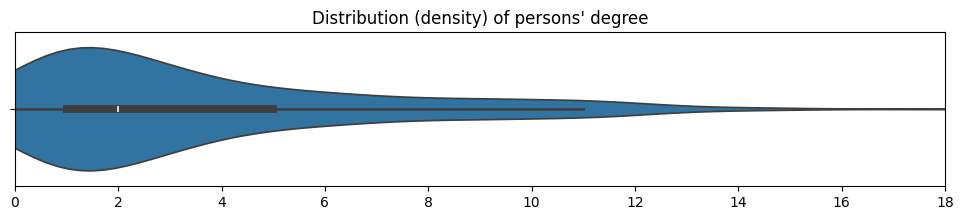

In [81]:
# Plot the distribution of degree centrality density

degree=[d[1] for d in nx.degree(GA_edu)]

min_val = min(degree)
max_val = max(degree)

plt.figure(figsize=(12, 2))
ax = sns.violinplot(data=degree, orient='h')

# Set the y-axis limits to exactly match the data range
ax.set_xlim(min_val, max_val)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

plt.title('Distribution (density) of persons\' degree')
plt.show()

In [82]:
### Add degree centrality to nodes
degree_centrality = nx.degree_centrality(GA_edu)
nx.set_node_attributes(GA_edu, degree_centrality, 'degree_centrality')
pprint.pprint(list(GA_edu.nodes.data())[10:12])


[('http://www.wikidata.org/entity/Q96413',
  {'birthYear': 1965,
   'country': 'Germany',
   'degree': 3,
   'degree_centrality': 0.008241758241758242,
   'edu_z': -0.17215078266202374,
   'emp_z': -0.3017225467043717,
   'gender': 'male',
   'label': 'Hartmut Rosa',
   'mem_z': -0.547933336621042,
   'per_activ': '1996-2020',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q104052848',
  {'birthYear': 1947,
   'country': 'Italy',
   'degree': 0,
   'degree_centrality': 0.0,
   'edu_z': -1.0571512850794693,
   'emp_z': -0.3827468064588184,
   'gender': 'female',
   'label': 'Loredana Sciolla',
   'mem_z': -0.7258925640967434,
   'per_activ': '1971-1995',
   'role': 'Standard'})]


In [83]:
### Graph to heavy to use Gephy online

# BEWARE : these can be very heavy graphs and shold not be committed to git!!!

nx.write_gexf(GA_edu, f"da_graphs/GA_edu.gexf")

### Inspect individuals

In [84]:
### Export node attributes to dataframe
nodes_data ={node: GA_edu.nodes[node] for node in GA_edu.nodes}
nodes_df = pd.DataFrame(nodes_data).T
nodes_df.reset_index(inplace=True)
nodes_df.columns = ['personUri', 'label', 'birthYear', 'gender', 'per_activ', 'country', 
 'role','degree','degree_centrality', 'edu_z','emp_z','mem_z']
nodes_df.head(2)


,personUri,label,birthYear,gender,per_activ,country,role,degree,degree_centrality,edu_z,emp_z,mem_z
0,http://www.wikidata.org/entity/Q538477,Iván Szelényi,1938,male,1971-1995,Austria Hungary,0.41785,1.166214,1.414377,Standard,5,0.013736
1,http://www.wikidata.org/entity/Q112671,Peter Flora,1944,male,1971-1995,Austria Hungary,-0.467151,-0.382747,-0.18397,Standard,2,0.005495


#### Explore degree centrality on gr_edu

In [85]:
nodes_df.sort_values(by='degree', ascending=False).iloc[30:40]

,personUri,label,birthYear,gender,per_activ,country,role,degree,degree_centrality,edu_z,emp_z,mem_z
199,http://www.wikidata.org/entity/Q1425193,Michael Mann,1942,male,1971-1995,United Kingdom,-1.057151,0.742631,1.206465,Standard,0,0.0
231,http://www.wikidata.org/entity/Q76357,Jürgen Habermas,1929,male,1971-1995,Germany,-1.057151,0.731917,1.98982,Standard,0,0.0
153,http://www.wikidata.org/entity/Q88427,Jürgen Kuczynski,1904,male,1946-1970,Germany,-0.172151,0.708999,-0.769779,Standard,3,0.008242
33,http://www.wikidata.org/entity/Q594320,Mark S. Granovetter,1943,male,1971-1995,United States Can.,2.187851,0.614476,1.192797,Standard,11,0.03022
112,http://www.wikidata.org/entity/Q11728079,Jolanta Kulpińska,1928,female,1971-1995,Poland,-0.467151,0.60912,-0.711031,Standard,2,0.005495
308,http://www.wikidata.org/entity/Q351815,Robert D. Putnam,1941,male,1971-1995,United States Can.,0.122849,0.549199,1.270826,Standard,4,0.010989
305,http://www.wikidata.org/entity/Q2529253,Frans van Vught,1950,male,1971-1995,Belgium Netherl.,-0.762151,0.536228,-0.30635,Standard,1,0.002747
193,http://www.wikidata.org/entity/Q6797081,Mayer Zald,1931,male,1971-1995,United States Can.,-0.172151,0.529423,1.709163,Standard,3,0.008242
242,http://www.wikidata.org/entity/Q17317979,Mihai Ralea,1896,male,1921-1945,Central Europe,-0.762151,0.485716,-0.763281,Standard,1,0.002747
317,http://www.wikidata.org/entity/Q3470277,Salustiano del Campo,1931,male,1971-1995,Spain Port.,1.30285,0.485298,-0.748785,Standard,8,0.021978


In [86]:
duckdb.query("""
    SELECT label,degree, birthYear,country,per_activ,role,edu_z,emp_z, mem_z
    FROM nodes_df
    ORDER BY degree DESC
    LIMIT 10
""").to_df()

,label,degree,birthYear,country,per_activ,role,edu_z,emp_z,mem_z
0,Piotr Sztompka,9.807445,1944,Poland,1971-1995,-0.762151,Hidden Gem,1,0.002747
1,Monika Kostera,6.686362,1963,Poland,1996-2020,-0.467151,Workhorse,2,0.005495
2,Mary Douglas,6.086418,1921,Italy,1946-1970,-1.057151,Hidden Gem,0,0.000000
3,Paul Lazarsfeld,4.529386,1901,Austria Hungary,1946-1970,0.417850,Standard,5,0.013736
4,Sextil Pușcariu,4.377886,1877,Central Europe,1921-1945,-0.172151,Workhorse,3,0.008242
5,Tzvetan Todorov,4.375480,1939,Central Europe,1971-1995,-0.172151,Standard,3,0.008242
6,Florian Znaniecki,3.841409,1882,Poland,1921-1945,-0.762151,Workhorse,1,0.002747
7,Charles Tilly,3.771582,1929,United States Can.,1971-1995,1.302850,Star,8,0.021978
8,Manuel Castells,3.182461,1942,Spain Port.,1971-1995,-0.762151,Hidden Gem,1,0.002747
9,Jan Stanisław Bystroń,3.110883,1892,Poland,1921-1945,-0.467151,Workhorse,2,0.005495


In [87]:
duckdb.query("""
    SELECT label,degree, birthYear,country,per_activ,role,edu_z,emp_z, mem_z
    FROM nodes_df
    WHERE label LIKE '%Einstein%'
             or label LIKE '%Bohr%'
             or label LIKE '%Planck%'
    ORDER BY degree DESC
    LIMIT 10
""").to_df()

,label,degree,birthYear,country,per_activ,role,edu_z,emp_z,mem_z


In [88]:
gr_edu_degree_1000=nodes_df.sort_values(by='degree', ascending=False).iloc[:1000]
#gr_edu_degree_1000.head(2)
df=gr_edu_degree_1000
# Create the crosstab
crosstab = pd.crosstab(df['country'], df['per_activ'])


In [89]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


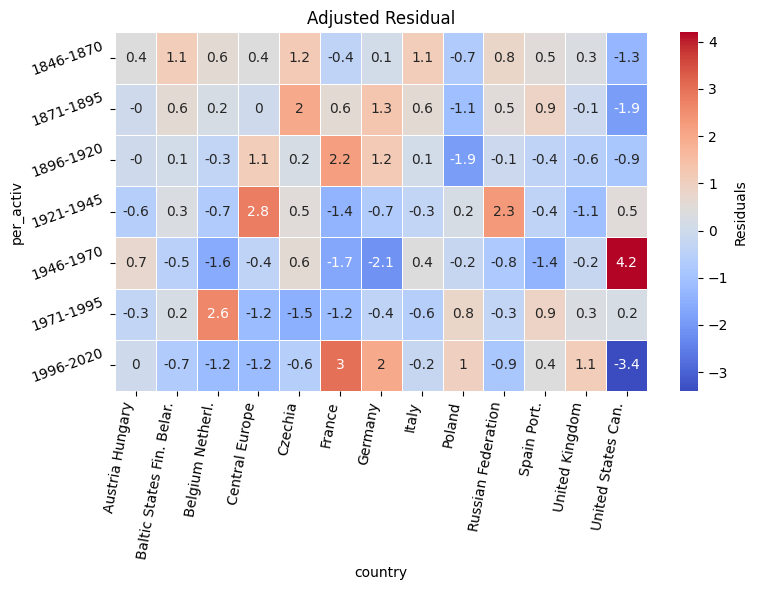

In [90]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(8, 6))

In [91]:
gr_edu_degree_1000.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,degree,degree_centrality,edu_z,emp_z,mem_z
82,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,1,0.002747
85,http://www.wikidata.org/entity/Q6900199,Monika Kostera,1963,female,1996-2020,Poland,-0.467151,6.686362,-0.752325,Workhorse,2,0.005495


### Get the most relevant educational institutions

In [92]:

node_list = set(gr_edu_degree_1000.personUri)

edges_data = [
    {
        'source': u,
        'target': v,
        'orgsLabels': d.get('orgsLabels'),
        'orgsNumber': d.get('orgsNumber')

    } 
    for u, v, d in GA_edu.edges(data=True) 
    if u in node_list or v in node_list
]

df_edu_1000_edges = pd.DataFrame(edges_data, columns=['source', 'target', 'orgsLabels', 'orgsNumber'])

In [93]:
df_edu_1000_edges[df_edu_1000_edges.orgsNumber>1].head()

,source,target,orgsLabels,orgsNumber
37,http://www.wikidata.org/entity/Q156268,http://www.wikidata.org/entity/Q333686,Lycée Louis-le-Grand|École Normale Supérieure,2
38,http://www.wikidata.org/entity/Q156268,http://www.wikidata.org/entity/Q62559657,Lycée Louis-le-Grand|École Normale Supérieure,2
67,http://www.wikidata.org/entity/Q2711710,http://www.wikidata.org/entity/Q1177958,"Harvard University|University of California, B...",2
77,http://www.wikidata.org/entity/Q2711710,http://www.wikidata.org/entity/Q943311,"University of California, Berkeley|Harvard Uni...",2
123,http://www.wikidata.org/entity/Q6834209,http://www.wikidata.org/entity/Q7150264,Harvard University|Swarthmore College,2


In [94]:
# Explode the pipe-separated values into separate rows
df_exploded = df_edu_1000_edges.assign(orgsLabels=df_edu_1000_edges['orgsLabels'].str.split('|')).explode('orgsLabels')
df_exploded.iloc[:3]


,source,target,orgsLabels,orgsNumber
0,http://www.wikidata.org/entity/Q538477,http://www.wikidata.org/entity/Q28058670,"University of California, Berkeley",1
1,http://www.wikidata.org/entity/Q538477,http://www.wikidata.org/entity/Q591030,"University of California, Berkeley",1
2,http://www.wikidata.org/entity/Q538477,http://www.wikidata.org/entity/Q943311,"University of California, Berkeley",1


In [95]:
df_exploded[df_exploded.orgsNumber>1].iloc[:3]

,source,target,orgsLabels,orgsNumber
37,http://www.wikidata.org/entity/Q156268,http://www.wikidata.org/entity/Q333686,Lycée Louis-le-Grand,2
37,http://www.wikidata.org/entity/Q156268,http://www.wikidata.org/entity/Q333686,École Normale Supérieure,2
38,http://www.wikidata.org/entity/Q156268,http://www.wikidata.org/entity/Q62559657,Lycée Louis-le-Grand,2


In [96]:
# Strip whitespace and remove NaNs
df_exploded['orgsLabels'] = df_exploded['orgsLabels'].str.strip()
df_exploded = df_exploded.dropna(subset=['orgsLabels'])

# Count occurrences
university_counts = df_exploded['orgsLabels'].value_counts()

print(university_counts.iloc[:30])

orgsLabels
Harvard University                                           156
University of Chicago                                         93
Faculty of Philosophy and Sociology, University of Warsaw     65
University of Warsaw                                          39
Columbia University                                           35
University of California, Berkeley                            23
Humboldt-Universität zu Berlin                                22
Freie Universität Berlin                                      18
University of Vienna                                          15
London School of Economics and Political Science              15
École Normale Supérieure                                      15
Heidelberg University                                         14
Yale University                                               12
Leipzig University                                             9
School for Advanced Studies in the Social Sciences             9
Stanford Unive

### Slice graph using k-cores

Cf. this [notebook for the methodology](https://github.com/Sciences-historiques-numeriques/histoire_numerique_methodes/blob/main/analyse_reseaux/networkx_slicing_with_cores.ipynb)

In [97]:
### Get k-cores

### A k-core is a maximal subgraph that contains nodes of degree k or more.
# https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.core.core_number.html#networkx.algorithms.core.core_number

core_numbers = nx.core_number(GA_edu)
print(str(core_numbers)[:150])



{'http://www.wikidata.org/entity/Q538477': 5, 'http://www.wikidata.org/entity/Q112671': 1, 'http://www.wikidata.org/entity/Q98304': 1, 'http://www.wik


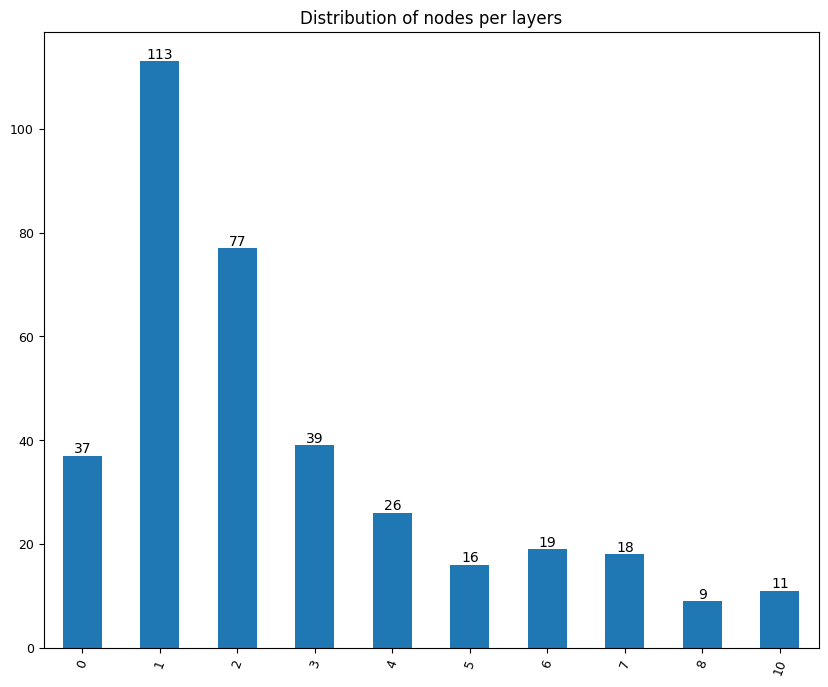

In [98]:
### Distribution of nodes per core layer
l = [v for k,v in core_numbers.items()]
ls = pd.Series(l)
grouped = ls.groupby(ls).size()


ax = grouped.plot.bar(stacked=True, rot=70, fontsize=9, figsize=(10,8))
plt.title('Distribution of nodes per layers')

## https://stackoverflow.com/questions/71320380/add-only-the-total-values-on-top-of-stacked-bars
ax.bar_label(ax.containers[-1])

plt.show()

In [99]:
# Identify layers based on core numbers
layers = {}
for node, core_number in core_numbers.items():
    if core_number not in layers:
        layers[core_number] = [node]
    else:
        layers[core_number].append(node)

In [100]:
cts = []
for core_number, layer in layers.items():
    # print(f"layers {core_number}: {len(layer)}")
    cts.append([core_number,len(layer),layer])



cts=sorted(cts, key=lambda x: x[0])
p=[pprint.pprint([e[0],e[1],e[2][:1] ]) for e in cts]

    

[0, 37, ['http://www.wikidata.org/entity/Q104052848']]
[1, 113, ['http://www.wikidata.org/entity/Q112671']]
[2, 77, ['http://www.wikidata.org/entity/Q62725']]
[3, 39, ['http://www.wikidata.org/entity/Q108304928']]
[4, 26, ['http://www.wikidata.org/entity/Q1044238']]
[5, 16, ['http://www.wikidata.org/entity/Q538477']]
[6, 19, ['http://www.wikidata.org/entity/Q5112640']]
[7, 18, ['http://www.wikidata.org/entity/Q1103678']]
[8, 9, ['http://www.wikidata.org/entity/Q11713930']]
[10, 11, ['http://www.wikidata.org/entity/Q1293632']]


nx.k_core: This function  performs an iterative peeling. If a node has degree 4 in the original graph but is connected to a node that gets removed, its degree drops. If it drops below 4, k_core removes it too. This continues until stability. This produces the true 4-core.

In [101]:
### Same result by using the k_core function
kc_G = nx.k_core(GA_edu, 8)
naf.basic_graph_properties(kc_G)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 20,
 'number_of_edges': 91,
 '------': '------',
 'is connected': False,
 'components': 2,
 'density': 0.4789473684210526}


In [102]:
### Graph to heavy to use Gephy online

# BEWARE : these can be very heavy graphs and shold not be committed to git!!!

nx.write_gexf(kc_G, f"da_graphs/GA_edu_k8.gexf")

## Explore the employment relationships graph

### Centrality distributions

#### Eigenvector centrality

In [103]:
### Add eigenvector to nodes

## If error: PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')
# increase number of max iterations
eigenvector = nx.eigenvector_centrality(GA_empl, max_iter=200)
nx.set_node_attributes(GA_empl, eigenvector, 'eigenvector')
pprint.pprint(list(GA_empl.nodes.data())[:2])

[('http://www.wikidata.org/entity/Q1714580',
  {'birthYear': 1956,
   'country': 'Germany',
   'edu_z': 0.12284938481045818,
   'eigenvector': 0.006514257800230492,
   'emp_z': 0.021318308195994427,
   'gender': 'female',
   'label': 'Jutta Allmendinger',
   'mem_z': -0.6991656337373403,
   'per_activ': '1996-2020',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q61616',
  {'birthYear': 1904,
   'country': 'Germany',
   'edu_z': -0.7621511176069874,
   'eigenvector': 0.001001249422313265,
   'emp_z': 0.21867977737793023,
   'gender': 'male',
   'label': 'Arnold Gehlen',
   'mem_z': -0.7721661106205401,
   'per_activ': '1946-1970',
   'role': 'Standard'})]


In [104]:
### Plot eigenvector density distribution 
eigenvector_s = pd.Series(list(eigenvector.values()))
stats = eigenvector_s.describe()

# Format decimal values
stats = stats.apply(lambda x: format(x, '.20f'))

print(stats)

count    365.00000000000000000000
mean       0.02558367166858046063
std        0.04572669185111093854
min        0.00000000000000000000
25%        0.00031755465388755072
50%        0.00442665475509742851
75%        0.02649760282242812071
max        0.20829626555367597440
dtype: object


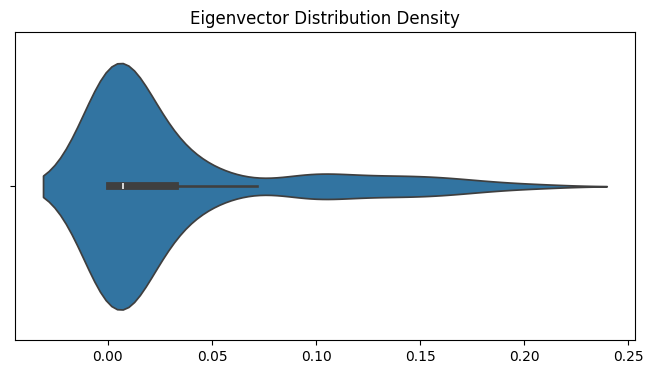

In [105]:
# Plot the distribution of eigenvector density

plt.figure(figsize=(8,4))
p = sns.violinplot(data=eigenvector_s[eigenvector_s> 0.00013610493515402787], orient='h')
plt.title('Eigenvector Distribution Density')
plt.show()

#### Betweenness centrality

In [107]:
# Dynamically adjust k so it never exceeds the actual number of nodes available
num_nodes = GA_empl.number_of_nodes()
k_value = min(500, num_nodes)

print(f"Total sociologists in layer: {num_nodes}. Running betweenness with k={k_value}")

# Run the centrality calculation with the safe k_value
betweenness = nx.betweenness_centrality(GA_empl, k=k_value, seed=42)
nx.set_node_attributes(GA_empl, betweenness, 'betweenness')
pprint.pprint(list(GA_empl.nodes.data())[:2])

Total sociologists in layer: 365. Running betweenness with k=365
[('http://www.wikidata.org/entity/Q1714580',
  {'betweenness': 0.00731355248362858,
   'birthYear': 1956,
   'country': 'Germany',
   'edu_z': 0.12284938481045818,
   'eigenvector': 0.006514257800230492,
   'emp_z': 0.021318308195994427,
   'gender': 'female',
   'label': 'Jutta Allmendinger',
   'mem_z': -0.6991656337373403,
   'per_activ': '1996-2020',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q61616',
  {'betweenness': 0.010885782331635181,
   'birthYear': 1904,
   'country': 'Germany',
   'edu_z': -0.7621511176069874,
   'eigenvector': 0.001001249422313265,
   'emp_z': 0.21867977737793023,
   'gender': 'male',
   'label': 'Arnold Gehlen',
   'mem_z': -0.7721661106205401,
   'per_activ': '1946-1970',
   'role': 'Standard'})]


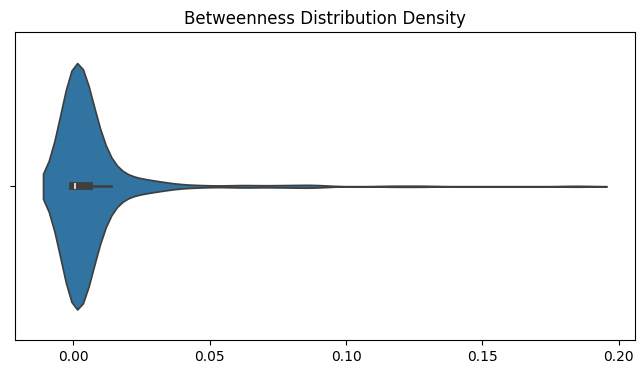

In [108]:
# Plot the distribution of eigenbetweenness vector density

plt.figure(figsize=(8,4))
p = sns.violinplot(data=betweenness, orient='h')
plt.title('Betweenness Distribution Density')
plt.show()

In [109]:
### Export node attributes to dataframe
nodes_data ={node: GA_empl.nodes[node] for node in GA_empl.nodes}
nodes_df_empl = pd.DataFrame(nodes_data).T
nodes_df_empl.reset_index(inplace=True)
nodes_df_empl.columns = ['personUri', 'label', 'birthYear', 'gender', 'per_activ', 'country', 
 'role', 'edu_z','emp_z','mem_z','eigenvector','betweenness']

In [110]:
## Dataframe with the features of the nodes
nodes_df_empl.head(3)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
0,http://www.wikidata.org/entity/Q1714580,Jutta Allmendinger,1956,female,1996-2020,Germany,0.122849,0.021318,-0.699166,Standard,0.006514,0.007314
1,http://www.wikidata.org/entity/Q61616,Arnold Gehlen,1904,male,1946-1970,Germany,-0.762151,0.21868,-0.772166,Standard,0.001001,0.010886
2,http://www.wikidata.org/entity/Q76357,Jürgen Habermas,1929,male,1971-1995,Germany,-1.057151,0.731917,1.98982,Standard,0.019826,0.020175


#### Explore eigenvector on gr_empl

In [111]:
nodes_df_empl.sort_values(by='eigenvector', ascending=False).iloc[:5]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
93,http://www.wikidata.org/entity/Q6969175,Nathan Keyfitz,1913,male,1946-1970,United States Can.,1.00785,1.460772,1.445931,Star,0.208296,0.033368
114,http://www.wikidata.org/entity/Q1586301,Harrison White,1930,male,1971-1995,United States Can.,-0.467151,1.143358,1.722909,Hidden Gem,0.206602,0.027622
125,http://www.wikidata.org/entity/Q677793,Shmuel Eisenstadt,1923,male,1946-1970,Poland,2.187851,-0.120997,1.788989,Standard,0.189957,0.004738
122,http://www.wikidata.org/entity/Q504319,David Riesman,1909,male,1946-1970,United States Can.,-0.467151,-0.156121,1.279866,Standard,0.184268,0.004102
110,http://www.wikidata.org/entity/Q111536,William Julius Wilson,1935,male,1971-1995,United States Can.,-1.057151,-0.02029,1.554265,Standard,0.181295,0.00656


In [112]:
gr_empl_eigenv_1000=nodes_df_empl.sort_values(by='eigenvector', ascending=False).iloc[:1000]
gr_empl_eigenv_1000.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
93,http://www.wikidata.org/entity/Q6969175,Nathan Keyfitz,1913,male,1946-1970,United States Can.,1.00785,1.460772,1.445931,Star,0.208296,0.033368
114,http://www.wikidata.org/entity/Q1586301,Harrison White,1930,male,1971-1995,United States Can.,-0.467151,1.143358,1.722909,Hidden Gem,0.206602,0.027622


In [113]:
df=gr_empl_eigenv_1000
# Create the crosstab
crosstab = pd.crosstab(df['country'], df['per_activ'])


In [114]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


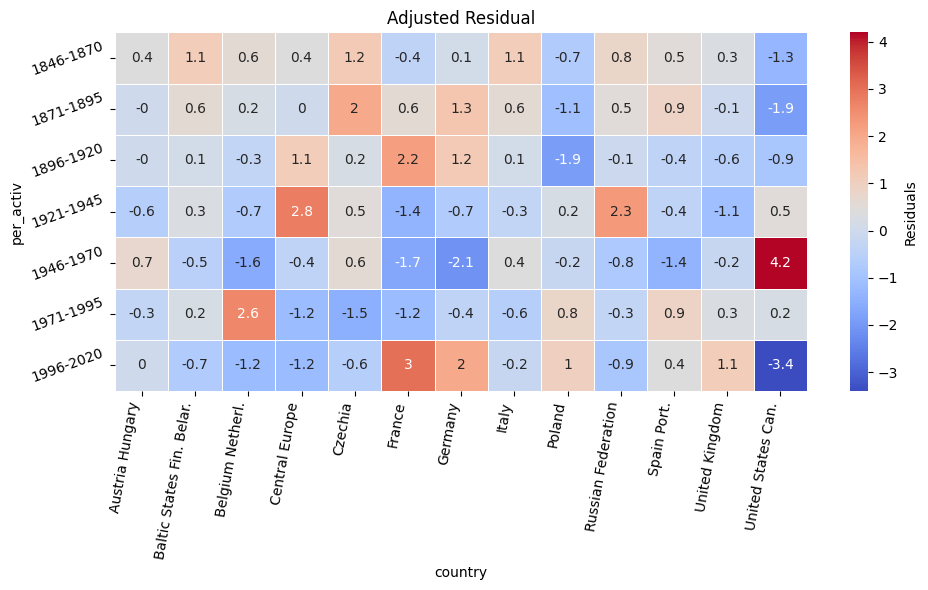

In [115]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(10, 6))

In [116]:
crosstab

per_activ,1846-1870,1871-1895,1896-1920,1921-1945,1946-1970,1971-1995,1996-2020
country,,,,,,,
Austria Hungary,0,0,1,1,5,6,3
Baltic States Fin. Belar.,0,0,0,1,1,3,0
Belgium Netherl.,0,0,0,0,0,9,0
Central Europe,0,0,2,5,3,4,1
Czechia,0,1,0,1,2,0,0
France,0,2,6,2,6,14,15
Germany,1,3,5,4,6,19,14
Italy,0,0,0,0,2,2,1
Poland,0,0,0,7,14,28,14


### Get the most relevant employment institutions

In [117]:

node_list = set(gr_empl_eigenv_1000.personUri)

edges_data = [
    {
        'source': u,
        'target': v,
        'orgsLabels': d.get('orgsLabels'),
        'orgsNumber': d.get('orgsNumber')

    } 
    for u, v, d in GA_empl.edges(data=True) 
    if u in node_list or v in node_list
]

df_empl_eigenv_1000 = pd.DataFrame(edges_data, columns=['source', 'target', 'orgsLabels', 'orgsNumber'])

In [118]:
# Explode the pipe-separated values into separate rows
df_exploded = df_empl_eigenv_1000.assign(orgsLabels=df_empl_eigenv_1000['orgsLabels'].str.split('|')).explode('orgsLabels')
# Strip whitespace and remove NaNs
df_exploded['orgsLabels'] = df_exploded['orgsLabels'].str.strip()
df_exploded = df_exploded.dropna(subset=['orgsLabels'])

# Count occurrences
university_counts = df_exploded['orgsLabels'].value_counts()

print(university_counts.iloc[:30])

orgsLabels
University of Warsaw                                  490
University of Chicago                                 445
Harvard University                                    338
Columbia University                                   145
University of California, Berkeley                    122
London School of Economics and Political Science      107
University of Michigan                                 99
Yale University                                        83
University of California, Los Angeles                  49
Stanford University                                    41
Humboldt-Universität zu Berlin                         39
University of Cambridge                                36
Freie Universität Berlin                               36
Northwestern University                                36
School for Advanced Studies in the Social Sciences     33
University of Paris                                    29
National Center for Scientific Research                28
Uni

#### Explore betweenness on gr_empl

In [119]:
nodes_df_empl.sort_values(by='betweenness', ascending=False).iloc[:5]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
140,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,0.037269,0.184442
29,http://www.wikidata.org/entity/Q6900199,Monika Kostera,1963,female,1996-2020,Poland,-0.467151,6.686362,-0.752325,Workhorse,0.001454,0.12795
159,http://www.wikidata.org/entity/Q231349,Mary Douglas,1921,female,1946-1970,Italy,-1.057151,6.086418,1.906697,Hidden Gem,0.179818,0.117091
260,http://www.wikidata.org/entity/Q94037,Paul Lazarsfeld,1901,male,1946-1970,Austria Hungary,0.41785,4.529386,0.639449,Standard,0.009595,0.088909
41,http://www.wikidata.org/entity/Q558729,Sextil Pușcariu,1877,male,1921-1945,Central Europe,-0.172151,4.377886,-0.762648,Workhorse,0.000335,0.086167


In [120]:
gr_empl_betweenness_1000=nodes_df_empl.sort_values(by='betweenness', ascending=False).iloc[:1000]
gr_empl_betweenness_1000.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
140,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,0.037269,0.184442
29,http://www.wikidata.org/entity/Q6900199,Monika Kostera,1963,female,1996-2020,Poland,-0.467151,6.686362,-0.752325,Workhorse,0.001454,0.12795


In [121]:
df=gr_empl_betweenness_1000
# Create the crosstab
crosstab = pd.crosstab(df['country'], df['per_activ'])


In [122]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


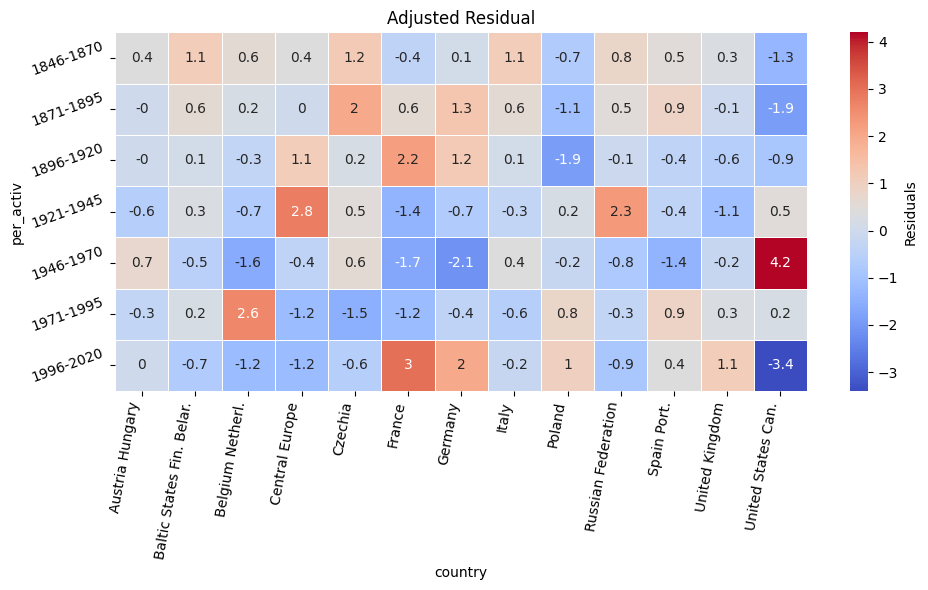

In [123]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(10, 6))

### Get the most intermediary employment institutions

In [124]:

node_list = set(gr_empl_betweenness_1000.personUri)

edges_data = [
    {
        'source': u,
        'target': v,
        'orgsLabels': d.get('orgsLabels'),
        'orgsNumber': d.get('orgsNumber')

    } 
    for u, v, d in GA_empl.edges(data=True) 
    if u in node_list or v in node_list
]

df_empl_eigenv_1000 = pd.DataFrame(edges_data, columns=['source', 'target', 'orgsLabels', 'orgsNumber'])

In [125]:
# Explode the pipe-separated values into separate rows
df_exploded = df_empl_eigenv_1000.assign(orgsLabels=df_empl_eigenv_1000['orgsLabels'].str.split('|')).explode('orgsLabels')
# Strip whitespace and remove NaNs
df_exploded['orgsLabels'] = df_exploded['orgsLabels'].str.strip()
df_exploded = df_exploded.dropna(subset=['orgsLabels'])

# Count occurrences
university_counts = df_exploded['orgsLabels'].value_counts()

print(university_counts.iloc[:30])

orgsLabels
University of Warsaw                                  490
University of Chicago                                 445
Harvard University                                    338
Columbia University                                   145
University of California, Berkeley                    122
London School of Economics and Political Science      107
University of Michigan                                 99
Yale University                                        83
University of California, Los Angeles                  49
Stanford University                                    41
Humboldt-Universität zu Berlin                         39
University of Cambridge                                36
Freie Universität Berlin                               36
Northwestern University                                36
School for Advanced Studies in the Social Sciences     33
University of Paris                                    29
National Center for Scientific Research                28
Uni

### Create a subgraph with high eigenvector centrality scores

In [126]:
centrality = {node: data.get('eigenvector', 0) for node, data in GA_empl.nodes(data=True)}
# Extract scores
scores = list(centrality.values())

In [127]:
# Calculate third quartile (75th percentile)
threshold = np.percentile(scores, 75)

# Select nodes above the threshold
nodes_to_keep = [node for node, score in centrality.items() if score > threshold]

# Create subgraph
subGA_empl = GA_empl.subgraph(nodes_to_keep)
naf.basic_graph_properties(subGA_empl)

{'is_multigraph': False,
 'is_directed': False,
 'number_of_nodes': 91,
 'number_of_edges': 1134,
 '------': '------',
 'is connected': True,
 'components': 1,
 'density': 0.27692307692307694}


In [128]:
### Graph to heavy to use Gephy online

# BEWARE : these can be very heavy graphs and shold not be committed to git!!!

nx.write_gexf(subGA_empl, f"da_graphs/subGA_empl.gexf")

## Explore the membership relationships graph

### Centrality distributions

#### Eigenvector centrality

In [129]:
### Add eigenvector to nodes

## If error: PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')
# increase number of max iterations
eigenvector = nx.eigenvector_centrality(GA_memb, max_iter=200)
nx.set_node_attributes(GA_memb, eigenvector, 'eigenvector')
pprint.pprint(list(GA_memb.nodes.data())[:2])

[('http://www.wikidata.org/entity/Q1891695',
  {'birthYear': 1843,
   'country': 'Spain Port.',
   'edu_z': -1.0571512850794693,
   'eigenvector': 2.2338209897122713e-23,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'Manuel Sales y Ferré',
   'mem_z': -0.7722463298281199,
   'per_activ': '1871-1895',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q6228652',
  {'birthYear': 1951,
   'country': 'United Kingdom',
   'edu_z': -0.7621511176069874,
   'eigenvector': 9.351257006007699e-05,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'John David Brewer',
   'mem_z': -0.7652126223784745,
   'per_activ': '1996-2020',
   'role': 'Standard'})]


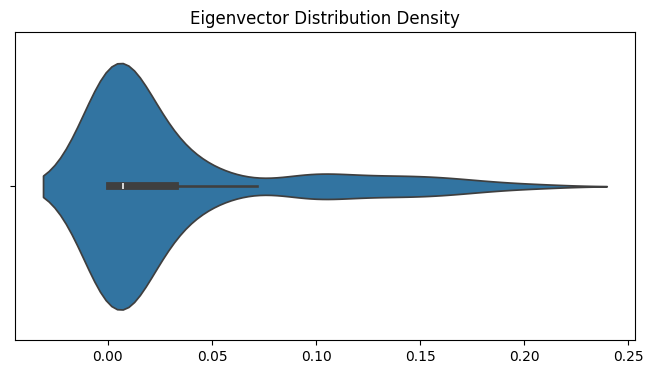

In [130]:
# Plot the distribution of eigenvector density

plt.figure(figsize=(8,4))
p = sns.violinplot(data=eigenvector_s[eigenvector_s> 0.00013610493515402787], orient='h')
plt.title('Eigenvector Distribution Density')
plt.show()

In [132]:
### Add betweenness to nodes
# Parameters for approximation: k=500, seed=42 and speed up

# 1. Dynamically find the maximum safe sample size
num_nodes_memb = GA_memb.number_of_nodes()
k_value_memb = min(500, num_nodes_memb)

print(f"Total sociologists in membership layer: {num_nodes_memb}")
print(f"Running approximation with safe k={k_value_memb}")

# 2. Run the calculation using the safe k value
betweenness = nx.betweenness_centrality(GA_memb, k=k_value_memb, seed=42)
nx.set_node_attributes(GA_memb, betweenness, 'betweenness')
pprint.pprint(list(GA_memb.nodes.data())[:2])

Total sociologists in membership layer: 365
Running approximation with safe k=365
[('http://www.wikidata.org/entity/Q1891695',
  {'betweenness': 0.0,
   'birthYear': 1843,
   'country': 'Spain Port.',
   'edu_z': -1.0571512850794693,
   'eigenvector': 2.2338209897122713e-23,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'Manuel Sales y Ferré',
   'mem_z': -0.7722463298281199,
   'per_activ': '1871-1895',
   'role': 'Standard'}),
 ('http://www.wikidata.org/entity/Q6228652',
  {'betweenness': 0.0,
   'birthYear': 1951,
   'country': 'United Kingdom',
   'edu_z': -0.7621511176069874,
   'eigenvector': 9.351257006007699e-05,
   'emp_z': -0.3827468064588184,
   'gender': 'male',
   'label': 'John David Brewer',
   'mem_z': -0.7652126223784745,
   'per_activ': '1996-2020',
   'role': 'Standard'})]


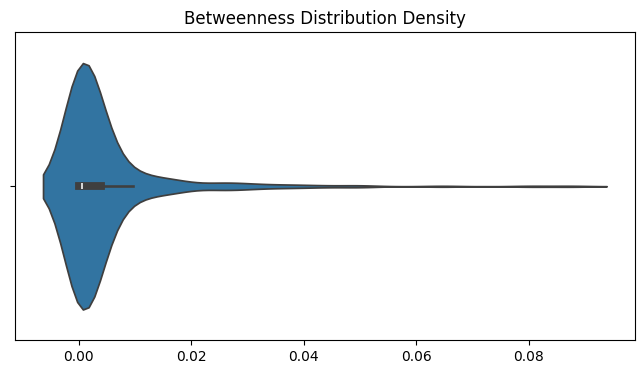

In [133]:
# Plot the distribution of eigenbetweenness vector density
betweenness_s = pd.Series(list(betweenness.values()))

plt.figure(figsize=(8,4))
p = sns.violinplot(data=betweenness_s, orient='h')
plt.title('Betweenness Distribution Density')
plt.show()

In [134]:
### Export node attributes to dataframe
nodes_data ={node: GA_memb.nodes[node] for node in GA_memb.nodes}
nodes_df_memb = pd.DataFrame(nodes_data).T
nodes_df_memb.reset_index(inplace=True)
nodes_df_memb.columns = ['personUri', 'label', 'birthYear', 'gender', 'per_activ', 'country', 
 'role', 'edu_z','emp_z','mem_z','eigenvector','betweenness']
nodes_df_memb.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
0,http://www.wikidata.org/entity/Q1891695,Manuel Sales y Ferré,1843,male,1871-1895,Spain Port.,-1.057151,-0.382747,-0.772246,Standard,0.0,0.0
1,http://www.wikidata.org/entity/Q6228652,John David Brewer,1951,male,1996-2020,United Kingdom,-0.762151,-0.382747,-0.765213,Standard,0.000094,0.0


#### Explore eigenvector on gr_memb

In [135]:
nodes_df_memb.sort_values(by='eigenvector', ascending=False).iloc[:5]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
39,http://www.wikidata.org/entity/Q333686,Alain Touraine,1925,male,1946-1970,France,-0.467151,-0.382747,1.995206,Standard,0.113263,0.037603
120,http://www.wikidata.org/entity/Q62478,Juan José Linz,1926,male,1971-1995,Germany,1.00785,-0.363837,2.005602,Academic Prince,0.112497,0.017142
23,http://www.wikidata.org/entity/Q9382864,Włodzimierz Wesołowski,1929,male,1971-1995,Poland,-0.172151,-0.244252,1.966646,Standard,0.112086,0.080271
34,http://www.wikidata.org/entity/Q76357,Jürgen Habermas,1929,male,1971-1995,Germany,-1.057151,0.731917,1.98982,Standard,0.111634,0.043959
259,http://www.wikidata.org/entity/Q528765,Stefan Nowak,1925,male,1946-1970,Poland,-0.172151,-0.301608,1.820174,Standard,0.110442,0.050634


In [136]:
gr_memb_eigenv_1000=nodes_df_memb.sort_values(by='eigenvector', ascending=False).iloc[:1000]
gr_memb_eigenv_1000.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
39,http://www.wikidata.org/entity/Q333686,Alain Touraine,1925,male,1946-1970,France,-0.467151,-0.382747,1.995206,Standard,0.113263,0.037603
120,http://www.wikidata.org/entity/Q62478,Juan José Linz,1926,male,1971-1995,Germany,1.00785,-0.363837,2.005602,Academic Prince,0.112497,0.017142


In [137]:
### Most connected persons
df=gr_memb_eigenv_1000
# Create the crosstab
crosstab = pd.crosstab(df['country'], df['per_activ'])


In [138]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


In [139]:
expected=bl.bivariate_stats(crosstab)

Chi-square : 123.71 , dof : 72
p-value : 0.0
Inertia (Phi-square):  0.34
Cramer:  0.238


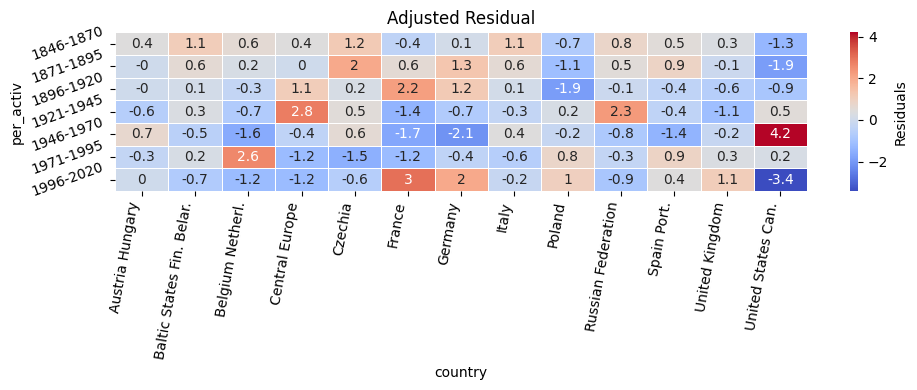

In [140]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(10, 4))

### Get the most relevant membership institutions

In [141]:

node_list = set(gr_memb_eigenv_1000.personUri)

edges_data = [
    {
        'source': u,
        'target': v,
        'orgsLabels': d.get('orgsLabels'),
        'orgsNumber': d.get('orgsNumber')

    } 
    for u, v, d in GA_memb.edges(data=True) 
    if u in node_list or v in node_list
]

df_memb_eigenv_1000 = pd.DataFrame(edges_data, columns=['source', 'target', 'orgsLabels', 'orgsNumber'])

In [142]:
# Explode the pipe-separated values into separate rows
df_exploded = df_memb_eigenv_1000.assign(orgsLabels=df_memb_eigenv_1000['orgsLabels'].str.split('|')).explode('orgsLabels')
# Strip whitespace and remove NaNs
df_exploded['orgsLabels'] = df_exploded['orgsLabels'].str.strip()
df_exploded = df_exploded.dropna(subset=['orgsLabels'])

# Count occurrences
university_counts = df_exploded['orgsLabels'].value_counts()

print(university_counts.iloc[:30])

orgsLabels
American Academy of Arts and Sciences                                 5250
Academia Europaea                                                      692
National Academy of Sciences                                           652
American Philosophical Society                                         545
Polish Sociological Association                                        327
British Academy                                                        155
Solidarity                                                              91
Institut Universitaire de France                                        76
Polish Academy of Sciences                                              74
Collegium Invisibile                                                    56
Berlin-Brandenburg Academy of Sciences and Humanities                   52
Royal Society of Canada                                                 40
Romanian Academy                                                        37
German Academy

In [143]:
nodes_df_memb.sort_values(by='eigenvector', ascending=False).iloc[:10]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
39,http://www.wikidata.org/entity/Q333686,Alain Touraine,1925,male,1946-1970,France,-0.467151,-0.382747,1.995206,Standard,0.113263,0.037603
120,http://www.wikidata.org/entity/Q62478,Juan José Linz,1926,male,1971-1995,Germany,1.00785,-0.363837,2.005602,Academic Prince,0.112497,0.017142
23,http://www.wikidata.org/entity/Q9382864,Włodzimierz Wesołowski,1929,male,1971-1995,Poland,-0.172151,-0.244252,1.966646,Standard,0.112086,0.080271
34,http://www.wikidata.org/entity/Q76357,Jürgen Habermas,1929,male,1971-1995,Germany,-1.057151,0.731917,1.98982,Standard,0.111634,0.043959
259,http://www.wikidata.org/entity/Q528765,Stefan Nowak,1925,male,1946-1970,Poland,-0.172151,-0.301608,1.820174,Standard,0.110442,0.050634
318,http://www.wikidata.org/entity/Q1352604,James G. March,1928,male,1971-1995,United States Can.,-0.467151,-0.194295,1.860471,Standard,0.110287,0.012009
218,http://www.wikidata.org/entity/Q170078,Ernest Gellner,1925,male,1946-1970,France,-0.467151,-0.133754,1.841369,Standard,0.110279,0.004442
151,http://www.wikidata.org/entity/Q76959,Ralf Dahrendorf,1929,male,1971-1995,Germany,-0.467151,0.123134,1.855275,Standard,0.110203,0.027602
31,http://www.wikidata.org/entity/Q1681079,James Samuel Coleman,1926,male,1971-1995,United States Can.,0.71285,1.149155,1.826929,Standard,0.109947,0.003428
245,http://www.wikidata.org/entity/Q310956,Clifford Geertz,1926,male,1971-1995,United States Can.,1.30285,-0.278281,1.826929,Academic Prince,0.109947,0.003428


#### Explore betweenness on gr_memb

In [144]:
nodes_df_memb.sort_values(by='betweenness', ascending=False).iloc[:5]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
153,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,0.078573,0.087463
23,http://www.wikidata.org/entity/Q9382864,Włodzimierz Wesołowski,1929,male,1971-1995,Poland,-0.172151,-0.244252,1.966646,Standard,0.112086,0.080271
209,http://www.wikidata.org/entity/Q152274,Edvard Beneš,1884,male,1921-1945,Czechia,-1.057151,-0.382747,-0.634657,Standard,0.004851,0.064631
259,http://www.wikidata.org/entity/Q528765,Stefan Nowak,1925,male,1946-1970,Poland,-0.172151,-0.301608,1.820174,Standard,0.110442,0.050634
354,http://www.wikidata.org/entity/Q159876,Julia Kristeva,1941,female,1971-1995,Central Europe,-0.467151,-0.373399,1.277767,Standard,0.08207,0.048833


In [145]:
gr_memb_betweenness_1000=nodes_df_memb.sort_values(by='betweenness', ascending=False).iloc[:1000]
gr_memb_betweenness_1000.head(2)

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
153,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,0.078573,0.087463
23,http://www.wikidata.org/entity/Q9382864,Włodzimierz Wesołowski,1929,male,1971-1995,Poland,-0.172151,-0.244252,1.966646,Standard,0.112086,0.080271


In [146]:
df=gr_memb_betweenness_1000
# Create the crosstab
crosstab = pd.crosstab(df['country'], df['per_activ'])


In [147]:
bl.check_chi_square_test_validity(crosstab)

Table valid for Chi-square test: False


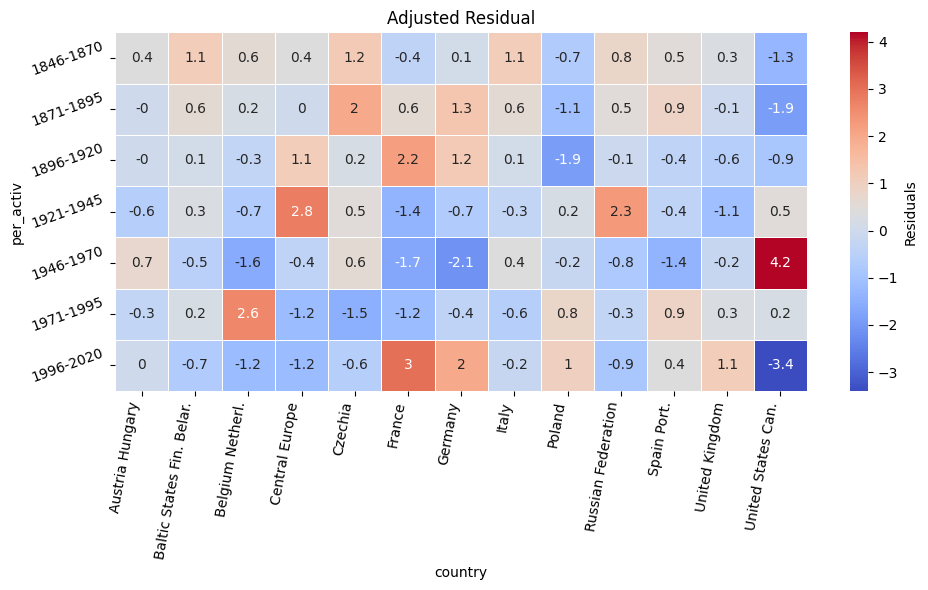

In [148]:
pp = bl.plot_chi2_residuals(crosstab.T, figsize=(10, 6))

### Get the intermediary membership institutions

In [149]:

node_list = set(gr_memb_betweenness_1000.personUri)

edges_data = [
    {
        'source': u,
        'target': v,
        'orgsLabels': d.get('orgsLabels'),
        'orgsNumber': d.get('orgsNumber')

    } 
    for u, v, d in GA_memb.edges(data=True) 
    if u in node_list or v in node_list
]

df_memb_betweenness_1000 = pd.DataFrame(edges_data, columns=['source', 'target', 'orgsLabels', 'orgsNumber'])

In [150]:
# Explode the pipe-separated values into separate rows
df_exploded = df_memb_betweenness_1000.assign(orgsLabels=df_memb_betweenness_1000['orgsLabels'].str.split('|')).explode('orgsLabels')
# Strip whitespace and remove NaNs
df_exploded['orgsLabels'] = df_exploded['orgsLabels'].str.strip()
df_exploded = df_exploded.dropna(subset=['orgsLabels'])

# Count occurrences
university_counts = df_exploded['orgsLabels'].value_counts()

print(university_counts.iloc[:30])

orgsLabels
American Academy of Arts and Sciences                                 5250
Academia Europaea                                                      692
National Academy of Sciences                                           652
American Philosophical Society                                         545
Polish Sociological Association                                        327
British Academy                                                        155
Solidarity                                                              91
Institut Universitaire de France                                        76
Polish Academy of Sciences                                              74
Collegium Invisibile                                                    56
Berlin-Brandenburg Academy of Sciences and Humanities                   52
Royal Society of Canada                                                 40
Romanian Academy                                                        37
German Academy

In [151]:
nodes_df_memb.sort_values(by='betweenness', ascending=False).iloc[:10]

,personUri,label,birthYear,gender,per_activ,country,role,edu_z,emp_z,mem_z,eigenvector,betweenness
153,http://www.wikidata.org/entity/Q444495,Piotr Sztompka,1944,male,1971-1995,Poland,-0.762151,9.807445,1.313729,Hidden Gem,0.078573,0.087463
23,http://www.wikidata.org/entity/Q9382864,Włodzimierz Wesołowski,1929,male,1971-1995,Poland,-0.172151,-0.244252,1.966646,Standard,0.112086,0.080271
209,http://www.wikidata.org/entity/Q152274,Edvard Beneš,1884,male,1921-1945,Czechia,-1.057151,-0.382747,-0.634657,Standard,0.004851,0.064631
259,http://www.wikidata.org/entity/Q528765,Stefan Nowak,1925,male,1946-1970,Poland,-0.172151,-0.301608,1.820174,Standard,0.110442,0.050634
354,http://www.wikidata.org/entity/Q159876,Julia Kristeva,1941,female,1971-1995,Central Europe,-0.467151,-0.373399,1.277767,Standard,0.08207,0.048833
34,http://www.wikidata.org/entity/Q76357,Jürgen Habermas,1929,male,1971-1995,Germany,-1.057151,0.731917,1.98982,Standard,0.111634,0.043959
217,http://www.wikidata.org/entity/Q160640,Raymond Aron,1905,male,1946-1970,France,-0.467151,2.782704,1.048662,Hidden Gem,0.077571,0.040832
39,http://www.wikidata.org/entity/Q333686,Alain Touraine,1925,male,1946-1970,France,-0.467151,-0.382747,1.995206,Standard,0.113263,0.037603
63,http://www.wikidata.org/entity/Q66216,Wolf Lepenies,1941,male,1971-1995,Poland,-1.057151,-0.120507,1.492838,Standard,0.086169,0.037521
102,http://www.wikidata.org/entity/Q914428,Raymond Boudon,1934,male,1971-1995,France,0.41785,-0.178597,1.857276,Standard,0.103955,0.033576


### Produce subgraph

In [152]:
df_exploded[:2]

,source,target,orgsLabels,orgsNumber
0,http://www.wikidata.org/entity/Q6228652,http://www.wikidata.org/entity/Q3035981,Royal Society of Edinburgh,1
1,http://www.wikidata.org/entity/Q6228652,http://www.wikidata.org/entity/Q6274485,Royal Society of Edinburgh,1


In [153]:
l_persons=duckdb.query("""
    SELECT DISTINCT source as person_uri
    FROM df_exploded
    WHERE orgsLabels IN ('French Academy of Sciences', 'Royal Swedish Academy of Sciences', 
                       'Göttingen Academy of Sciences and Humanities in Lower Saxony', 
                       'Bavarian Academy of Sciences and Humanities', 'Royal Netherlands Academy of Arts and Sciences',
                       'German Academy of Sciences Leopoldina')
    UNION
    SELECT target as person_uri
    FROM df_exploded
    WHERE orgsLabels IN ('French Academy of Sciences', 'Royal Swedish Academy of Sciences', 
                       'Göttingen Academy of Sciences and Humanities in Lower Saxony', 
                       'Bavarian Academy of Sciences and Humanities', 'Royal Netherlands Academy of Arts and Sciences',
                       'German Academy of Sciences Leopoldina ')

""").to_df()
print(len(l_persons))
l_persons.head(2)

26


,person_uri
0,http://www.wikidata.org/entity/Q1352604
1,http://www.wikidata.org/entity/Q76514


In [154]:
### Extract the subgraph using only the 1000 nodes
# .copy() creates a new independent graph object
sub_G = GA_memb.subgraph(l_persons.person_uri.to_list()).copy()

# 4. Verify and Export
print(f"Subgraph nodes: {sub_G.number_of_nodes()}")
print(f"Subgraph edges: {sub_G.number_of_edges()}")

graph_address="da_graphs/subgraph_membership_betweenness.graphml"

# Export directly to Gephi format
nx.write_graphml(sub_G, graph_address)

Subgraph nodes: 26
Subgraph edges: 73
